In [1]:
import h5py
import PIL.Image
import os, shutil
import tensorflow as tf
from tensorflow.keras.models import load_model
from keras import layers
from keras import models
from keras.preprocessing.image import ImageDataGenerator
from keras import optimizers
from keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt
from keras.layers import LeakyReLU
from keras.regularizers import l2

In [2]:
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


In [3]:
!unzip /content/drive/MyDrive/data/images_hur.zip -d /content/images_hur

Streaming output truncated to the last 5000 lines.
  inflating: /content/images_hur/train_another/no_damage/-95.627453_29.859303000000004.jpeg  
  inflating: /content/images_hur/train_another/no_damage/-95.62745600000001_29.777524.jpeg  
  inflating: /content/images_hur/train_another/no_damage/-95.627485_29.777865999999996.jpeg  
  inflating: /content/images_hur/train_another/no_damage/-95.62751800000001_29.857785999999997.jpeg  
  inflating: /content/images_hur/train_another/no_damage/-95.62751999999999_29.860796999999998.jpeg  
  inflating: /content/images_hur/train_another/no_damage/-95.627523_29.770004999999998.jpeg  
  inflating: /content/images_hur/train_another/no_damage/-95.62753000000001_29.863289.jpeg  
  inflating: /content/images_hur/train_another/no_damage/-95.627539_29.827047999999998.jpeg  
  inflating: /content/images_hur/train_another/no_damage/-95.627543_29.860021000000003.jpeg  
  inflating: /content/images_hur/train_another/no_damage/-95.627563_29.8628.jpeg  
  infl

In [4]:
input_path  = '/content/images_hur'

In [5]:
def print_file_sizes(input_path, subset):
  print('{}:'.format(subset))
  print('')
  path = input_path + subset + '/'
  for f in os.listdir(path):
    if not os.path.isdir(path + f):
      print(f.ljust(30) + str(round(os.path.getsize(path + f) / 1000000, 2)) + 'MB')
    else:
      sizes = [os.path.getsize(path+f+'/'+x)/1000000 for x in os.listdir(path + f)]
      print(f.ljust(30) + str(round(sum(sizes), 2)) + 'MB' + ' ({} files)'.format(len(sizes)))
  print('')
    
print_file_sizes(input_path, '/train_another')
print_file_sizes(input_path, '/validation_another')
print_file_sizes(input_path, '/test_another')
print_file_sizes(input_path, '/test')

/train_another:

damage                        12.56MB (5000 files)
no_damage                     15.07MB (5000 files)

/validation_another:

damage                        2.52MB (1000 files)
no_damage                     3.02MB (1000 files)

/test_another:

damage                        20.12MB (8000 files)
no_damage                     3.01MB (1000 files)

/test:

damage                        2.53MB (1000 files)
no_damage                     2.99MB (1000 files)



In [6]:
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [7]:
image_df = pd.DataFrame({'path': list(Path(input_path).glob('**/*.jp*g'))})
image_df['damage'] = image_df['path'].map(lambda x: x.parent.stem)
image_df['data_split'] = image_df['path'].map(lambda x: x.parent.parent.stem)
image_df['location'] = image_df['path'].map(lambda x: x.stem)
image_df['lon'] = image_df['location'].map(lambda x: float(x.split('_')[0]))
image_df['lat'] = image_df['location'].map(lambda x: float(x.split('_')[-1]))
image_df['path'] = image_df['path'].map(lambda x: str(x)) # convert the path back to a string
image_df.head()

,path,damage,data_split,location,lon,lat
0,/content/images_hur/test/damage/-95.119962_30....,damage,test,-95.119962_30.026288,-95.119962,30.026288
1,/content/images_hur/test/damage/-95.0791170000...,damage,test,-95.07911700000001_29.817569,-95.079117,29.817569
2,/content/images_hur/test/damage/-96.968407_28....,damage,test,-96.968407_28.619515000000003,-96.968407,28.619515
3,/content/images_hur/test/damage/-95.55846_29.7...,damage,test,-95.55846_29.766468,-95.558460,29.766468
4,/content/images_hur/test/damage/-96.988129_28....,damage,test,-96.988129_28.77533,-96.988129,28.775330


In [8]:
#Generating quick plot of the spatial distribution of the images:
s = 10
alpha = 0.5

# get the train-validation-test splits
image_df_train = image_df[image_df['data_split']=='train_another'].copy()
image_df_val = image_df[image_df['data_split']=='validation_another'].copy()
image_df_test = image_df[image_df['data_split']=='test_another'].copy()

# sort to ensure reproducible behaviour
image_df_train.sort_values('lat', inplace=True)
image_df_val.sort_values('lat', inplace=True)
image_df_test.sort_values('lat', inplace=True)
image_df_train.reset_index(drop=True,inplace=True)
image_df_val.reset_index(drop=True,inplace=True)
image_df_test.reset_index(drop=True,inplace=True)
image_df_dmg = image_df[image_df['damage']=='damage'].copy()
image_df_nodmg = image_df[image_df['damage']=='no_damage'].copy()
image_df_dmg.reset_index(drop=True,inplace=True)
image_df_nodmg.reset_index(drop=True,inplace=True)

In [9]:
import cv2
img = cv2.imread(image_df['path'][0], cv2.IMREAD_UNCHANGED)
np.shape(img)

(128, 128, 3)

In [10]:
print("Type:==> ", type(img[0,0,0]))
print("Min value==>", np.min(img[:,:,:]))
print("Max value==>", np.max(img[:,:,:]))

Type:==>  <class 'numpy.uint8'>
Min value==> 11
Max value==> 248


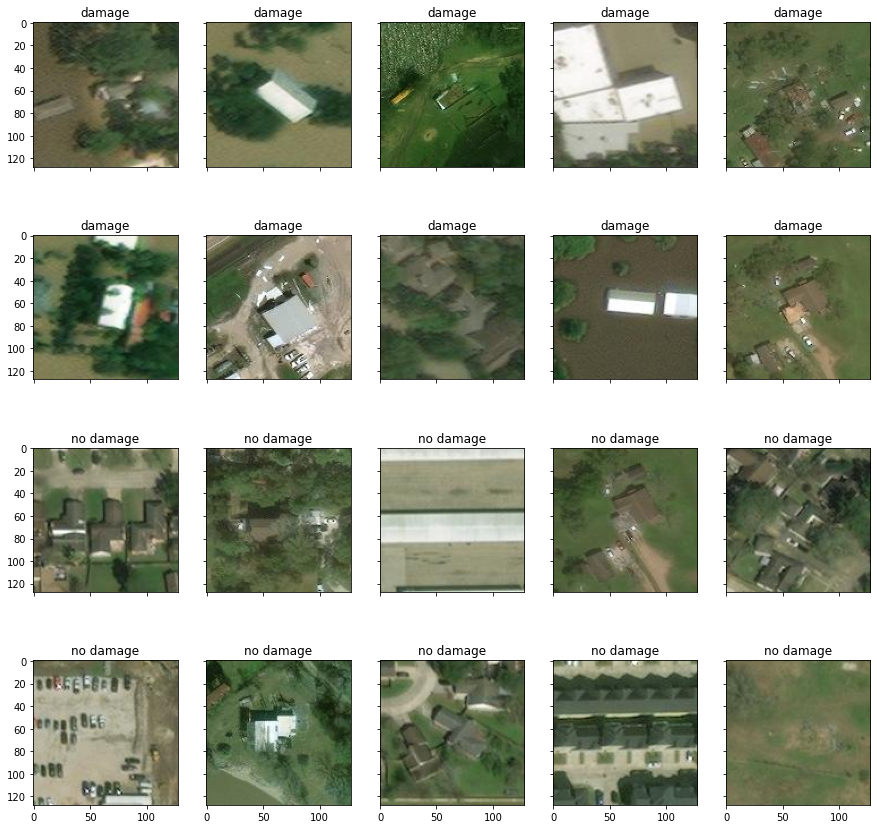

In [11]:
#Checking out images
fig, ax = plt.subplots(nrows=4, ncols=5, sharex=True, sharey=True, figsize=(15,15))
ax = ax.flatten()
for i in range(10):
  img = cv2.imread(image_df_dmg['path'][i], cv2.IMREAD_UNCHANGED)
  ax[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  ax[i].set_title('damage')
    
for i in range(10,20):
  img = cv2.imread(image_df_nodmg['path'][i], cv2.IMREAD_UNCHANGED)
  ax[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  ax[i].set_title('no damage')
    
plt.show()

In [12]:
dataset_dir = '/content/images_hur'
train_damage_dir = '/content/images_hur/train_another/damage'
validation_damage_dir = '/content/images_hur/validation_another/damage'
test_damage_dir = '/content/images_hur/test_another/damage'

train_nodamage_dir = '/content/images_hur/train_another/no_damage'
validation_nodamage_dir = '/content/images_hur/validation_another/no_damage'
test_nodamage_dir = '/content/images_hur/test_another/no_damage'

In [13]:
print('total training damage images: ',len(os.listdir(train_damage_dir)))
print('total validation damage images: ',len(os.listdir(validation_damage_dir)))
print('total test damage images: ',len(os.listdir(test_damage_dir)))
print("======================================")
print('total training no damage images: ',len(os.listdir(train_nodamage_dir)))
print('total validation no damage images: ',len(os.listdir(validation_nodamage_dir)))
print('total test no damage images: ',len(os.listdir(test_nodamage_dir)))

total training damage images:  5000
total validation damage images:  1000
total test damage images:  8000
total training no damage images:  5000
total validation no damage images:  1000
total test no damage images:  1000


In [14]:
from keras.preprocessing.image import ImageDataGenerator
# from keras import optimizers
from tensorflow.keras import optimizers

#train using transfer learning and data augmentation
train_datagen = ImageDataGenerator(rescale = 1./255,
                    rotation_range = 40,
                    width_shift_range = 0.2,
                    height_shift_range = 0.2,
                    shear_range = 0.2,
                    zoom_range = 0.2,vertical_flip = True,
                    horizontal_flip = True)
validation_datagen = ImageDataGenerator(rescale = 1./255) #validation data should not be augmented
train_generator = train_datagen.flow_from_directory(
                    '/content/images_hur/train_another', 
                    target_size = (150,150),
                    batch_size = 32,
                    class_mode = 'binary')
validation_generator = validation_datagen.flow_from_directory(
                    '/content/images_hur/validation_another', 
                    target_size = (150,150),
                    batch_size = 32,
                    class_mode = 'binary')
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
                    '/content/images_hur/test', #balanced test set 
                    target_size = (150,150),
                    batch_size = 20,
                    class_mode = 'binary')
test_another_datagen = ImageDataGenerator(rescale=1./255)
test_another_generator = test_another_datagen.flow_from_directory(
                    '/content/images_hur/test_another', #Unbalanced test set 
                    target_size = (150,150),
                    batch_size = 20,
                    class_mode = 'binary')
from keras.callbacks import EarlyStopping
#Callback for early stopping
es = EarlyStopping(
    monitor='val_accuracy', patience=10, mode='auto',
    baseline=None, restore_best_weights=True)

Found 10000 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.
Found 9000 images belonging to 2 classes.


In [15]:
def plot_acc(history):
  fig, ax = plt.subplots(1,2,figsize = (12,4))
  ax[0].plot(history.history['loss'],'r',alpha=0.5,lw=3,label = 'Training Loss')
  ax[0].plot(history.history['val_loss'],'b',alpha=0.5,lw=3,label = 'Validation Loss')
  ax[1].plot(history.history['accuracy'],'r',alpha=0.5,lw=3,label = 'Training Accuracy')
  ax[1].plot(history.history['val_accuracy'],'b',alpha=0.5,lw=3,label = 'Validation Accuracy')
  ax[0].legend(fontsize=14)
  ax[1].legend(fontsize=14)
  ax[0].set_xlabel('Epochs')
  ax[1].set_xlabel('Epochs');
  ax[0].set_ylabel('Loss')
  ax[1].set_ylabel('Accuracy %');

In [16]:
# vanilla model
from keras import layers
from keras import models
model = models.Sequential()
model.add(layers.Conv2D(32, (3,3), input_shape=(150, 150, 3), activation='relu'))
model.add(layers.MaxPooling2D((2,2)))
model.add(layers.Conv2D(64, (3,3), activation='relu'))
model.add(layers.MaxPooling2D((2,2)))
model.add(layers.Conv2D(128, (3,3), activation='relu'))
model.add(layers.MaxPooling2D((2,2)))
model.add(layers.Conv2D(128, (3,3), activation='relu'))
model.add(layers.MaxPooling2D((2,2)))
model.add(layers.Flatten())
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 17, 17, 128)      0

In [17]:
weights, bias= model.layers[0].get_weights()
assert weights.shape == (3,3,3,32), "Computed weights are incorrect"

kernels_filter1 = weights[:,:,:,0]
assert kernels_filter1.shape == (3,3,3)

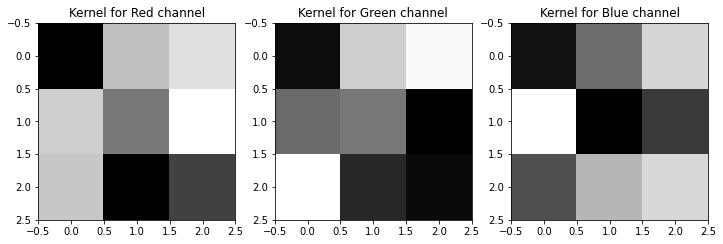

In [18]:
fig, axes = plt.subplots(1,3,figsize = (12,4))
colors = ['Red','Green','Blue']
for num, i in enumerate(axes):
  i.imshow(kernels_filter1[num],cmap='gray')
  i.set_title(f'Kernel for {colors[num]} channel')

Text(0.5, 1.0, '1st Filter of convolution')

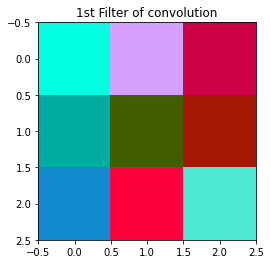

In [19]:
kernels_filter1 = (kernels_filter1 - kernels_filter1.min(axis=(0,1)))/(kernels_filter1.max(axis=(0,1)) - kernels_filter1.min(axis=(0,1)))
fig, ax = plt.subplots(1,1,figsize = (4,4))
ax.imshow(kernels_filter1)
ax.set_title(f'1st Filter of convolution')

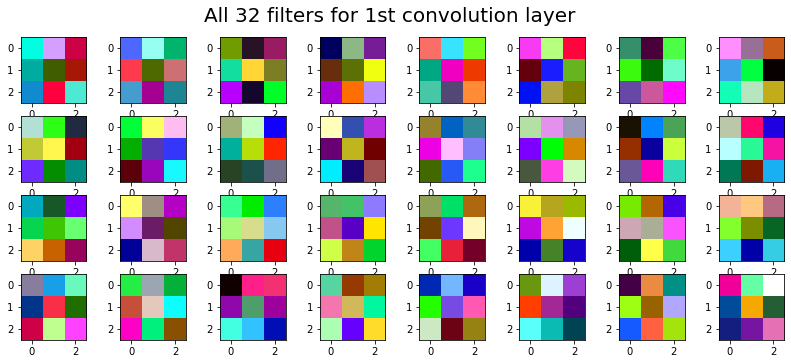

In [20]:
fig,ax=plt.subplots(4,8,figsize=(14,14))
fig.subplots_adjust(bottom=0.2,top=0.5)
for i in range(4):
    for j in range(8):
        filters= weights[:,:,:,(8*i)+j]
        filters = (filters - filters.min(axis=(0,1)))/(filters.max(axis=(0,1)) - filters.min(axis=(0,1)))
        ax[i,j].imshow(filters)
        
fig.suptitle('All 32 filters for 1st convolution layer',fontsize=20, y=0.53); 

In [21]:
def plot_featuremaps(img,activations,layer_names):
    fig, axs = plt.subplots(ncols=4, nrows=4,figsize = (6,6))
    gs = axs[1, 2].get_gridspec()
    # remove the underlying axes
    for ax in axs[1:-1, 1:-1]:
        ax[0].remove()
        ax[1].remove()
    axbig = fig.add_subplot(gs[1:-1, 1:-1])

    axbig.imshow(img.squeeze() + 0.5)

    axbig.axis('off')

    for i, axis in enumerate(axs.ravel()):
        axis.imshow(activations.squeeze()[:,:,i], cmap='gray')
        axis.axis('off')

    fig.tight_layout()
    fig.suptitle(f'Feature maps for {layer_names[0]}',size=16,y=1.05);

In [22]:
import tensorflow as tf
from tensorflow.keras.models import Model

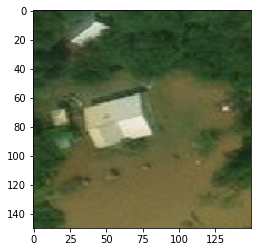

In [23]:
img_path = '/content/images_hur/train_another/damage/-93.606053_30.799283000000003.jpeg'
from keras.preprocessing import image
import numpy as np
img = image.load_img(img_path, target_size = (150,150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis = 0)
img_tensor /= 255.
plt.imshow(img_tensor[0])
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


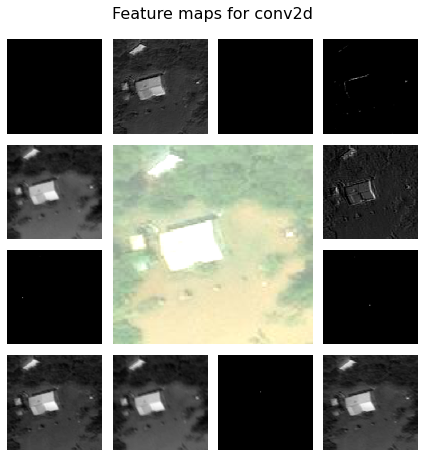

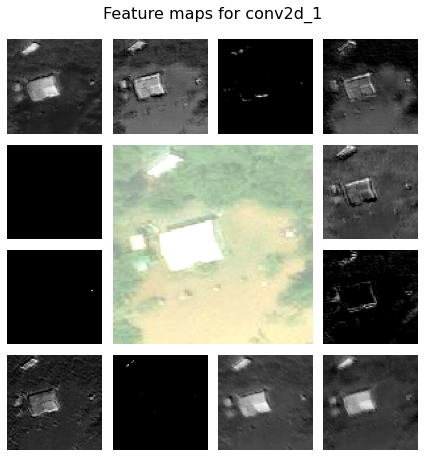

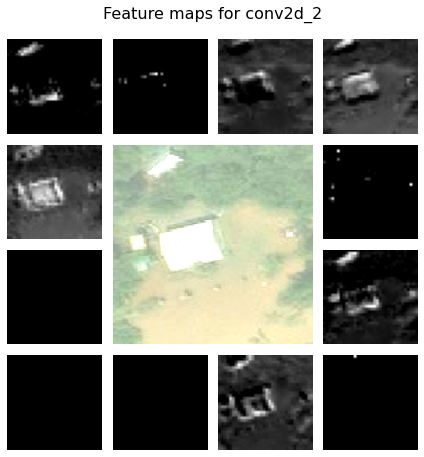

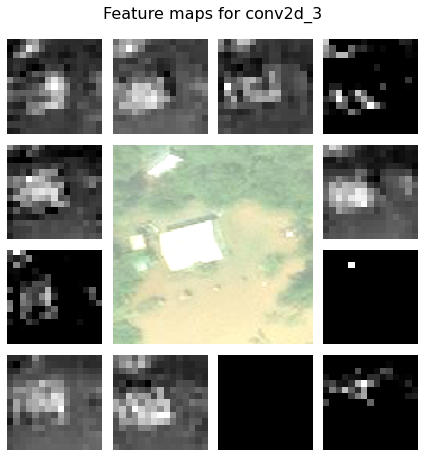

In [24]:
for i in range(0,7,2):
    layeri_output = model.layers[i].output
    activation_model = tf.keras.Model(model.input,layeri_output)
    activations = activation_model.predict(img_tensor)
    plot_featuremaps(img_tensor,activations,[model.layers[i].name])

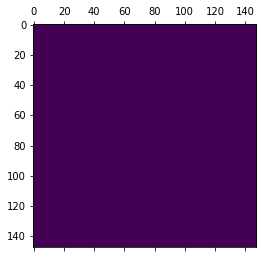

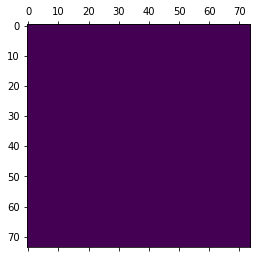

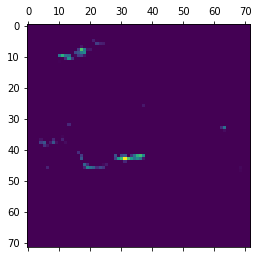

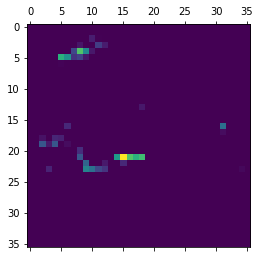

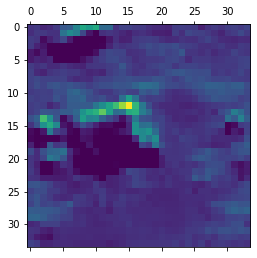

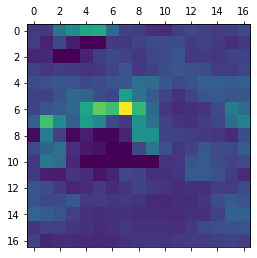

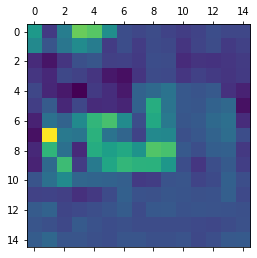

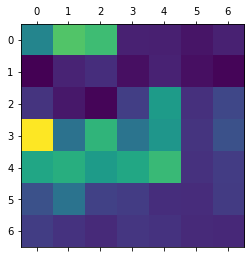

In [25]:
from keras import models
layer_outputs = [layer.output for layer in model.layers[:8]]
activation_model = models.Model(inputs = model.input, outputs = layer_outputs)
#First Layer
activations = activation_model.predict(img_tensor)
# first_layer_activation = activations[0]
# plt.matshow(first_layer_activation[0,:,:,2],cmap = 'viridis')
for i in range(0,8):
    first_layer_activation = activations[i]
    plt.matshow(first_layer_activation[0,:,:,2],cmap = 'viridis')

In [26]:
#compile the model with RMSprob with learning rate
from tensorflow import optimizers
model.compile(loss = 'binary_crossentropy', optimizer = optimizers.RMSprop(learning_rate=1e-4), metrics = ['accuracy'])
# model.compile(loss = 'binary_crossentropy', optimizer = optimizers.RMSprop(lr=1e-4), metrics = ['accuracy'])

In [27]:
#Processing the image via an image generator
from keras.preprocessing.image import ImageDataGenerator

#We will normalize the image value
train_datagen = ImageDataGenerator(rescale=1./255)
validation_datagen = ImageDataGenerator(rescale=1./255)

train_datagenerator = train_datagen.flow_from_directory('/content/images_hur/train_another', target_size=(150, 150), batch_size=20, class_mode='binary')
validation_datagenerator = validation_datagen.flow_from_directory('/content/images_hur/validation_another', target_size=(150, 150), batch_size=20, class_mode='binary')

Found 10000 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.


In [28]:
history = model.fit(train_datagenerator, steps_per_epoch=50, epochs=100, validation_data=validation_datagenerator, validation_steps=50, callbacks=[es])

Epoch 1/100
50/50 [==============================] - 6s 66ms/step - loss: 0.6806 - accuracy: 0.5350 - val_loss: 0.6545 - val_accuracy: 0.5010
Epoch 2/100
50/50 [==============================] - 3s 60ms/step - loss: 0.6257 - accuracy: 0.6530 - val_loss: 0.5673 - val_accuracy: 0.7910
Epoch 3/100
50/50 [==============================] - 3s 60ms/step - loss: 0.5403 - accuracy: 0.7460 - val_loss: 0.5531 - val_accuracy: 0.7190
Epoch 4/100
50/50 [==============================] - 3s 65ms/step - loss: 0.5272 - accuracy: 0.7550 - val_loss: 0.4915 - val_accuracy: 0.7940
Epoch 5/100
50/50 [==============================] - 3s 61ms/step - loss: 0.5081 - accuracy: 0.7930 - val_loss: 0.4286 - val_accuracy: 0.8250
Epoch 6/100
50/50 [==============================] - 3s 61ms/step - loss: 0.4465 - accuracy: 0.7980 - val_loss: 0.4129 - val_accuracy: 0.8340
Epoch 7/100
50/50 [==============================] - 3s 60ms/step - loss: 0.4505 - accuracy: 0.7930 - val_loss: 0.3715 - val_accuracy: 0.8500
Epoch 

In [29]:
test_results = model.evaluate(test_generator)
test_another_results = model.evaluate(test_another_generator)
print("Test accuracy \n Balanced Test set   = {} \n Unbalanced Test set = {}".format(np.around(test_results[1], 3), np.around(test_another_results[1], 3)))

450/450 [==============================] - 11s 23ms/step - loss: 0.1783 - accuracy: 0.9302
Test accuracy 
 Balanced Test set   = 0.942 
 Unbalanced Test set = 0.93


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


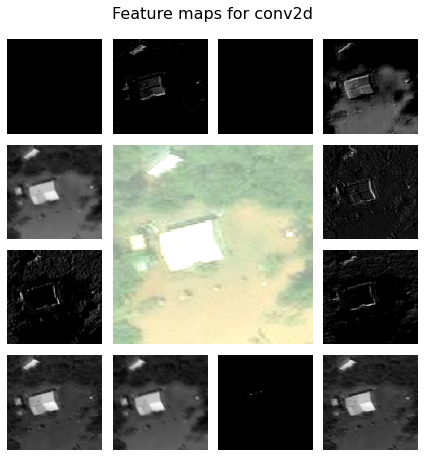

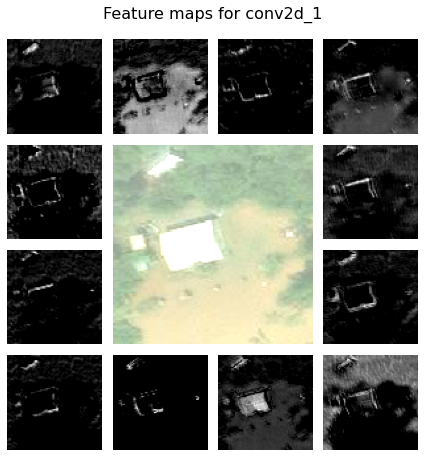

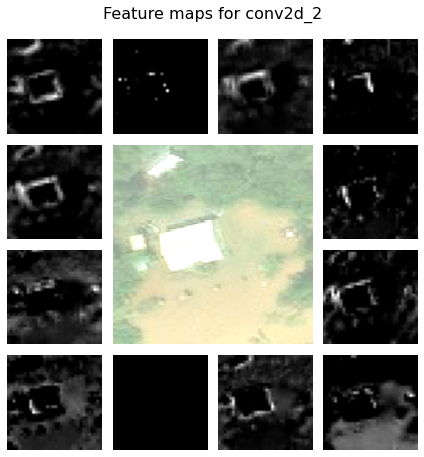

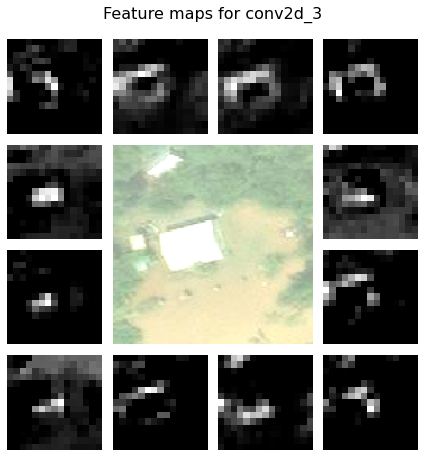

In [30]:
for i in range(0,7,2):
    layeri_output = model.layers[i].output
    activation_model = tf.keras.Model(model.input,layeri_output)
    activations = activation_model.predict(img_tensor)
    plot_featuremaps(img_tensor,activations,[model.layers[i].name])

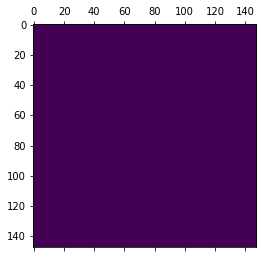

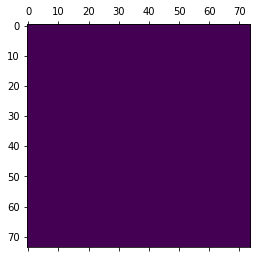

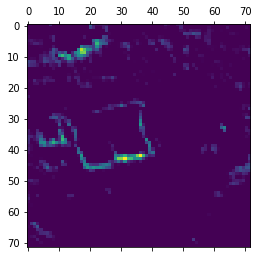

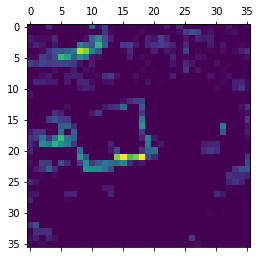

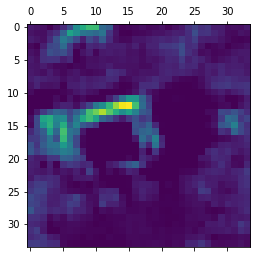

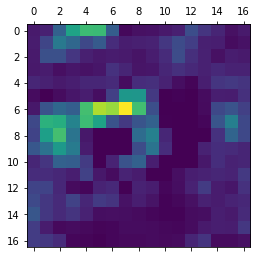

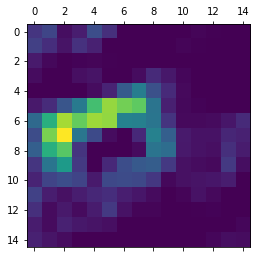

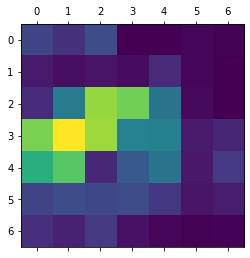

In [31]:
from keras import models
layer_outputs = [layer.output for layer in model.layers[:8]]
activation_model = models.Model(inputs = model.input, outputs = layer_outputs)
#First Layer
activations = activation_model.predict(img_tensor)
# first_layer_activation = activations[0]
# plt.matshow(first_layer_activation[0,:,:,2],cmap = 'viridis')
for i in range(0,8):
    first_layer_activation = activations[i]
    plt.matshow(first_layer_activation[0,:,:,2],cmap = 'viridis')

In [32]:
# Using vanilla model+dropout
model = models.Sequential()
model.add(layers.Conv2D(32,(3,3), activation = 'relu', input_shape = (150,150,3)))
model.add(layers.MaxPooling2D((2,2)))
model.add(layers.Conv2D(64,(3,3), activation = 'relu'))
model.add(layers.MaxPooling2D((2,2)))
model.add(layers.Conv2D(128,(3,3), activation = 'relu'))
model.add(layers.MaxPooling2D((2,2)))
model.add(layers.Conv2D(128,(3,3), activation = 'relu'))
model.add(layers.MaxPooling2D((2,2)))
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(512,activation = 'relu'))
model.add(layers.Dense(1, activation = 'sigmoid'))
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 74, 74, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 17, 17, 128)     

In [33]:
weights, bias= model.layers[0].get_weights()
assert weights.shape == (3,3,3,32), "Computed weights are incorrect"

kernels_filter1 = weights[:,:,:,0]
assert kernels_filter1.shape == (3,3,3)

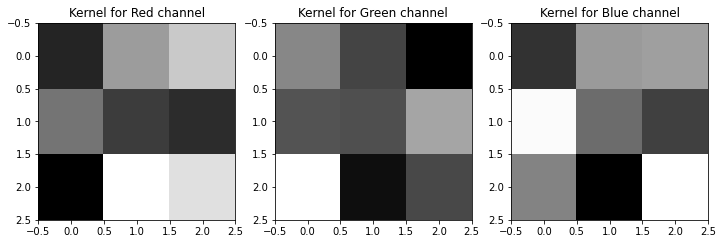

In [34]:
fig, axes = plt.subplots(1,3,figsize = (12,4))
colors = ['Red','Green','Blue']
for num, i in enumerate(axes):
  i.imshow(kernels_filter1[num],cmap='gray')
  i.set_title(f'Kernel for {colors[num]} channel')

Text(0.5, 1.0, '1st Filter of convolution')

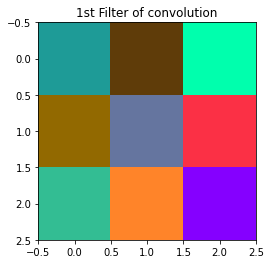

In [35]:
kernels_filter1 = (kernels_filter1 - kernels_filter1.min(axis=(0,1)))/(kernels_filter1.max(axis=(0,1)) - kernels_filter1.min(axis=(0,1)))
fig, ax = plt.subplots(1,1,figsize = (4,4))
ax.imshow(kernels_filter1)
ax.set_title(f'1st Filter of convolution')

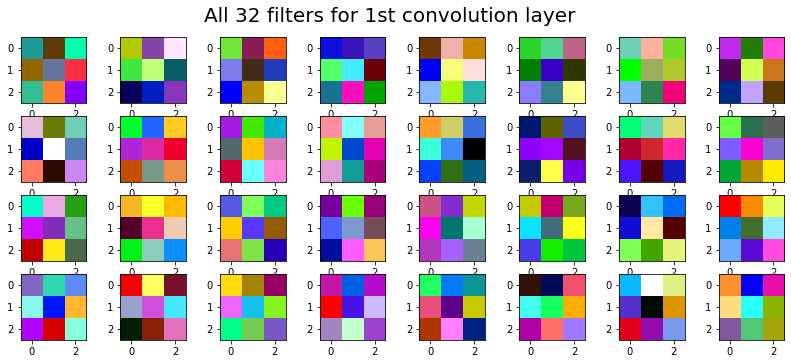

In [36]:
fig,ax=plt.subplots(4,8,figsize=(14,14))
fig.subplots_adjust(bottom=0.2,top=0.5)
for i in range(4):
    for j in range(8):
        filters= weights[:,:,:,(8*i)+j]
        filters = (filters - filters.min(axis=(0,1)))/(filters.max(axis=(0,1)) - filters.min(axis=(0,1)))
        ax[i,j].imshow(filters)
        
fig.suptitle('All 32 filters for 1st convolution layer',fontsize=20, y=0.53);

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


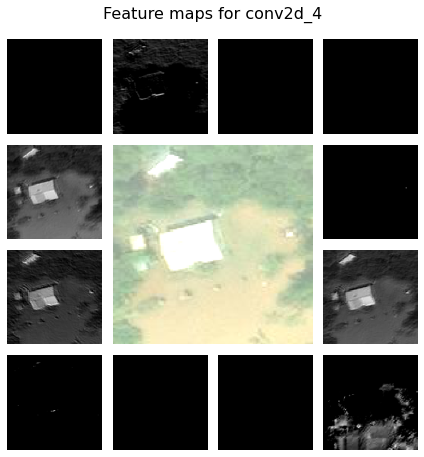

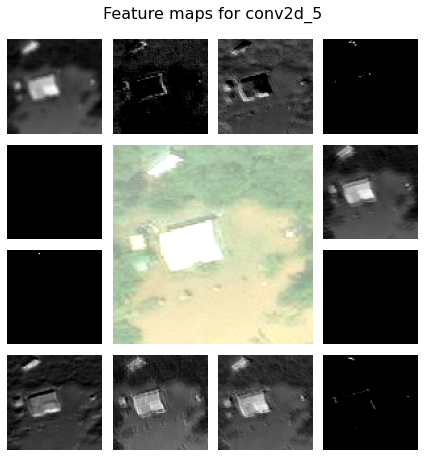

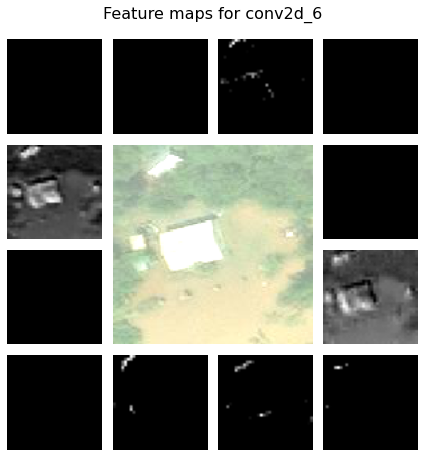

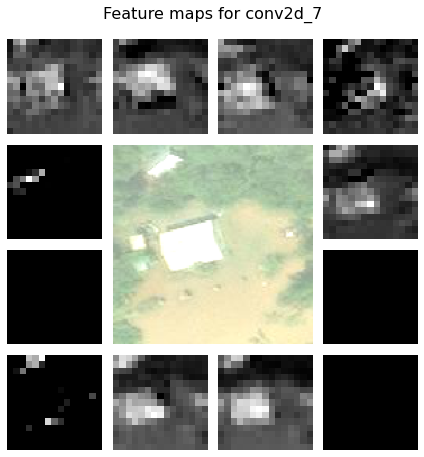

In [37]:
for i in range(0,7,2):
    layeri_output = model.layers[i].output
    activation_model = tf.keras.Model(model.input,layeri_output)
    activations = activation_model.predict(img_tensor)
    plot_featuremaps(img_tensor,activations,[model.layers[i].name])

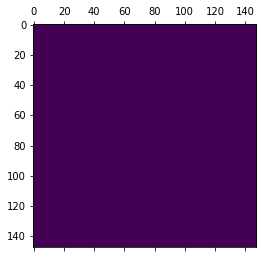

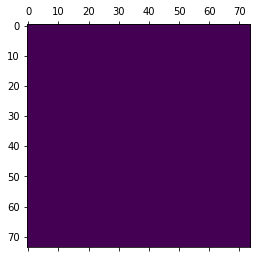

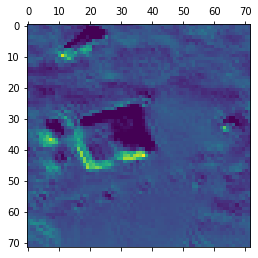

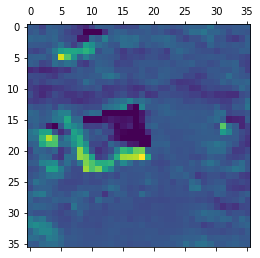

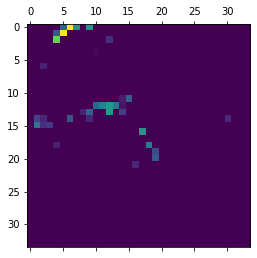

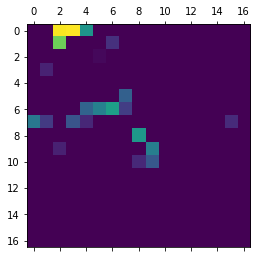

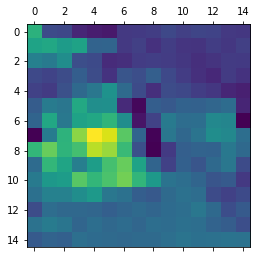

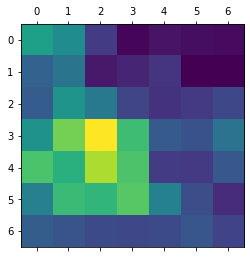

In [38]:
from keras import models
layer_outputs = [layer.output for layer in model.layers[:8]]
activation_model = models.Model(inputs = model.input, outputs = layer_outputs)
#First Layer
activations = activation_model.predict(img_tensor)
# first_layer_activation = activations[0]
# plt.matshow(first_layer_activation[0,:,:,2],cmap = 'viridis')
for i in range(0,8):
    first_layer_activation = activations[i]
    plt.matshow(first_layer_activation[0,:,:,2],cmap = 'viridis')

In [39]:
model.compile(loss = 'binary_crossentropy',
                optimizer = optimizers.RMSprop(learning_rate=1e-4),
#               optimizer = optimizers.RMSprop(lr=1e-4),
                 metrics = ['accuracy'])
history = model.fit_generator(
            train_generator,
            steps_per_epoch = 100,
            epochs = 100,
            validation_data = validation_generator,
            validation_steps = 50, callbacks=[es])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  # Remove the CWD from sys.path while we load stuff.


Epoch 1/100
100/100 [==============================] - 24s 225ms/step - loss: 0.6514 - accuracy: 0.6033 - val_loss: 0.7142 - val_accuracy: 0.5531
Epoch 2/100
100/100 [==============================] - 23s 230ms/step - loss: 0.5652 - accuracy: 0.7242 - val_loss: 0.5178 - val_accuracy: 0.7994
Epoch 3/100
100/100 [==============================] - 23s 230ms/step - loss: 0.5052 - accuracy: 0.7766 - val_loss: 0.5173 - val_accuracy: 0.7831
Epoch 4/100
100/100 [==============================] - 24s 237ms/step - loss: 0.4766 - accuracy: 0.7905 - val_loss: 0.5351 - val_accuracy: 0.7719
Epoch 5/100
100/100 [==============================] - 23s 229ms/step - loss: 0.4495 - accuracy: 0.8094 - val_loss: 0.4701 - val_accuracy: 0.7925
Epoch 6/100
100/100 [==============================] - 23s 229ms/step - loss: 0.4153 - accuracy: 0.8319 - val_loss: 0.5037 - val_accuracy: 0.7588
Epoch 7/100
100/100 [==============================] - 23s 227ms/step - loss: 0.3896 - accuracy: 0.8406 - val_loss: 0.2943 -

In [40]:
#Evaluating with balanced and unbalanced test datsets
test_results = model.evaluate(test_generator)
test_another_results = model.evaluate(test_another_generator)
print("Test accuracy \n Balanced Test set   = {} \n Unbalanced Test set = {}".format(np.around(test_results[1], 3), np.around(test_another_results[1], 3)))

450/450 [==============================] - 12s 27ms/step - loss: 0.1201 - accuracy: 0.9591
Test accuracy 
 Balanced Test set   = 0.943 
 Unbalanced Test set = 0.959


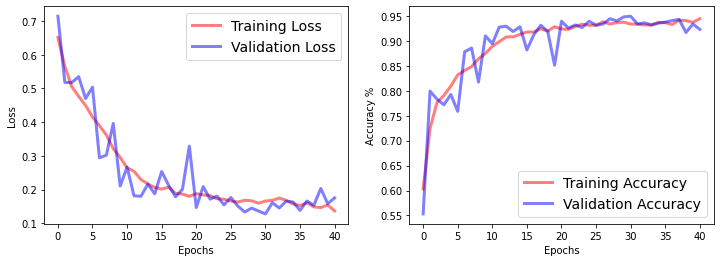

In [41]:
plot_acc(history)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


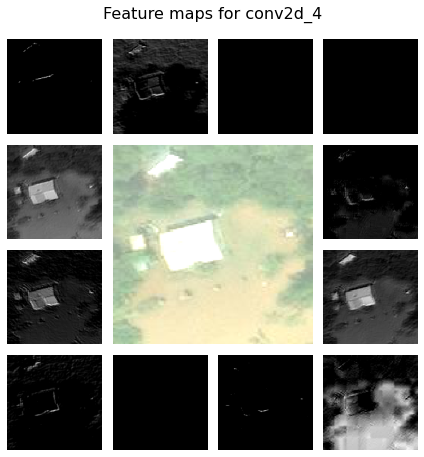

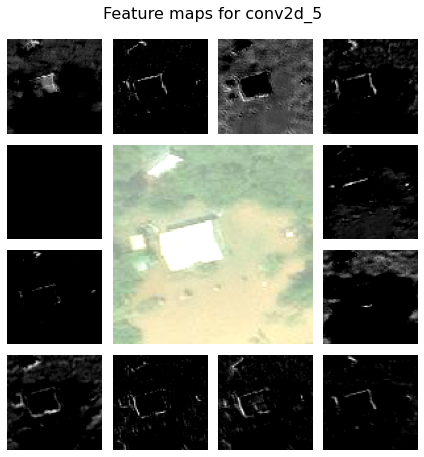

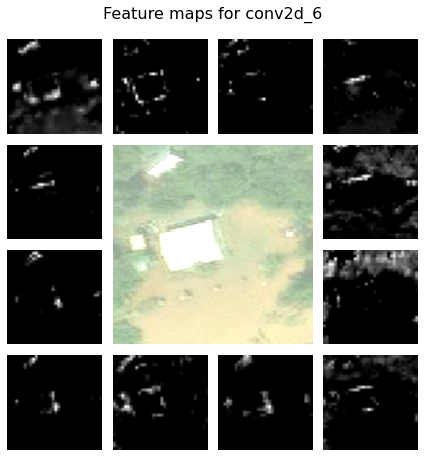

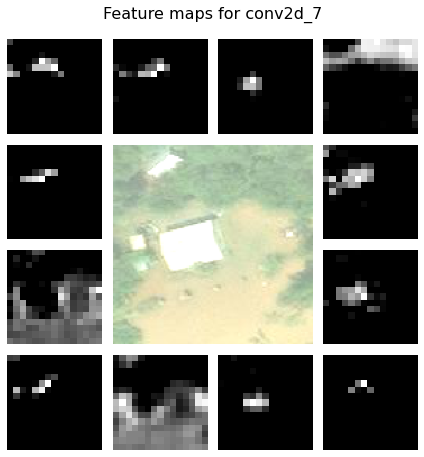

In [42]:
for i in range(0,7,2):
    layeri_output = model.layers[i].output
    activation_model = tf.keras.Model(model.input,layeri_output)
    activations = activation_model.predict(img_tensor)
    plot_featuremaps(img_tensor,activations,[model.layers[i].name])

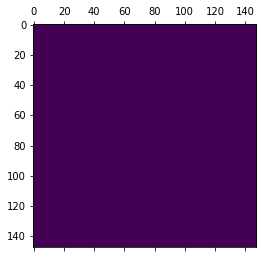

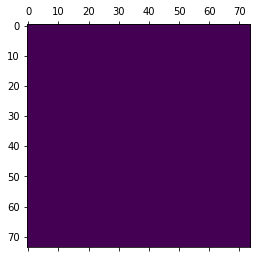

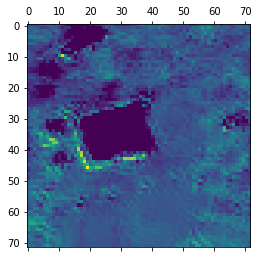

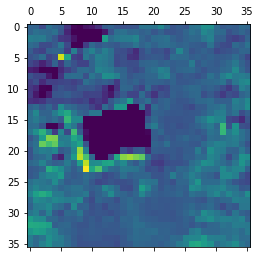

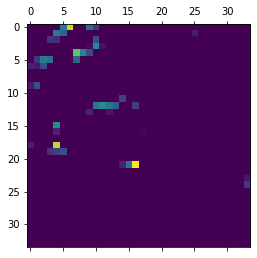

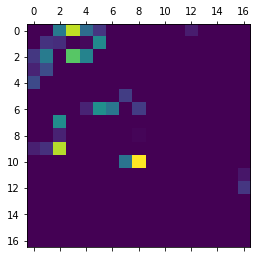

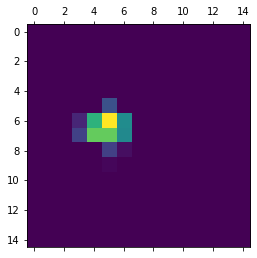

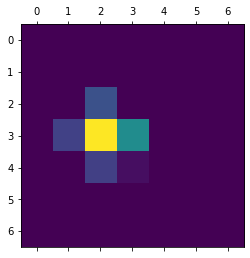

In [43]:
from keras import models
layer_outputs = [layer.output for layer in model.layers[:8]]
activation_model = models.Model(inputs = model.input, outputs = layer_outputs)
#First Layer
activations = activation_model.predict(img_tensor)
# first_layer_activation = activations[0]
# plt.matshow(first_layer_activation[0,:,:,2],cmap = 'viridis')
for i in range(0,8):
    first_layer_activation = activations[i]
    plt.matshow(first_layer_activation[0,:,:,2],cmap = 'viridis')

In [44]:
#Using VGG16
from keras.applications.vgg16 import VGG16
from keras.layers import Flatten,Dense,Dropout,Input
from keras.models import Model 
from keras.utils import np_utils
import tensorflow as tf
conv_base = VGG16(weights = 'imagenet',
          include_top = False, #no dense layers
          input_shape = (150,150,3))
regularizer = tf.keras.regularizers.l2(0.1)
conv_base.summary()

58900480/58889256 [==============================] - 0s 0us/step
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 150, 150, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 150, 150, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 75, 75, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 75, 75, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 75, 75, 128)       147584    
                                                              

In [45]:
x=conv_base.output
x=Flatten()(x)
x=Dense(units=512,activation="relu")(x)
x=Dropout(0.5)(x)
x=Dense(units=64,activation="relu",kernel_regularizer=regularizer)(x)
x=Dense(units=1,activation="sigmoid")(x)
model=Model(conv_base.input,x)
model.summary()

Model: "model_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 150, 150, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 150, 150, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 75, 75, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 75, 75, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 75, 75, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 37, 37, 128)       0  

In [46]:
weights, bias= model.layers[1].get_weights()
assert weights.shape == (3,3,3,64), "Computed weights are incorrect"

kernels_filter1 = weights[:,:,:,0]
assert kernels_filter1.shape == (3,3,3)

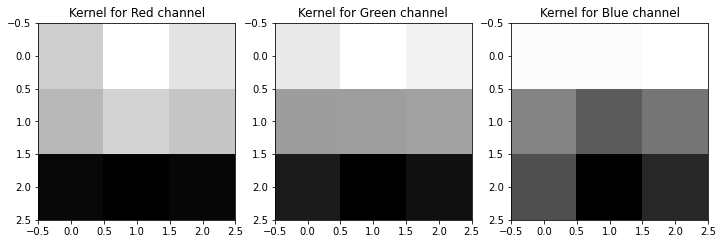

In [47]:
fig, axes = plt.subplots(1,3,figsize = (12,4))
colors = ['Red','Green','Blue']
for num, i in enumerate(axes):
  i.imshow(kernels_filter1[num],cmap='gray')
  i.set_title(f'Kernel for {colors[num]} channel')

Text(0.5, 1.0, '1st Filter of convolution')

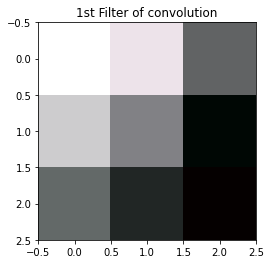

In [48]:
kernels_filter1 = (kernels_filter1 - kernels_filter1.min(axis=(0,1)))/(kernels_filter1.max(axis=(0,1)) - kernels_filter1.min(axis=(0,1)))
fig, ax = plt.subplots(1,1,figsize = (4,4))
ax.imshow(kernels_filter1)
ax.set_title(f'1st Filter of convolution')

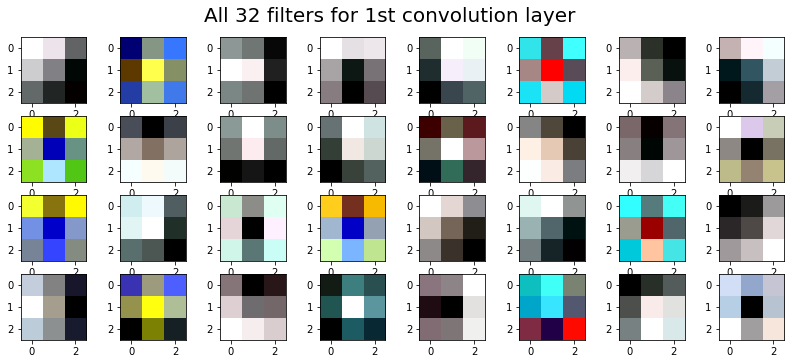

In [49]:
fig,ax=plt.subplots(4,8,figsize=(14,14))
fig.subplots_adjust(bottom=0.2,top=0.5)
for i in range(4):
    for j in range(8):
        filters= weights[:,:,:,(8*i)+j]
        filters = (filters - filters.min(axis=(0,1)))/(filters.max(axis=(0,1)) - filters.min(axis=(0,1)))
        ax[i,j].imshow(filters)
        
fig.suptitle('All 32 filters for 1st convolution layer',fontsize=20, y=0.53); 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

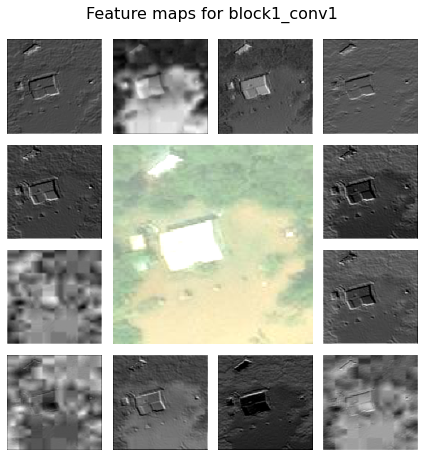

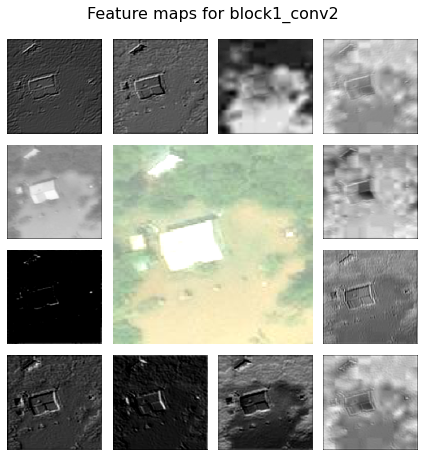

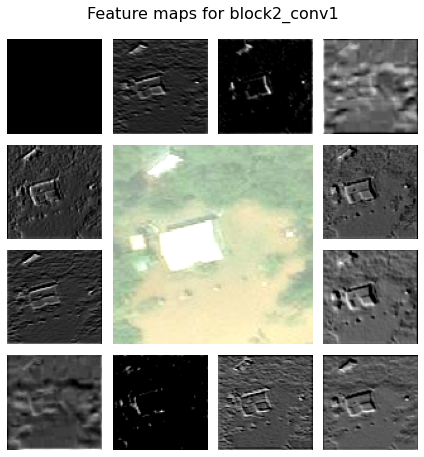

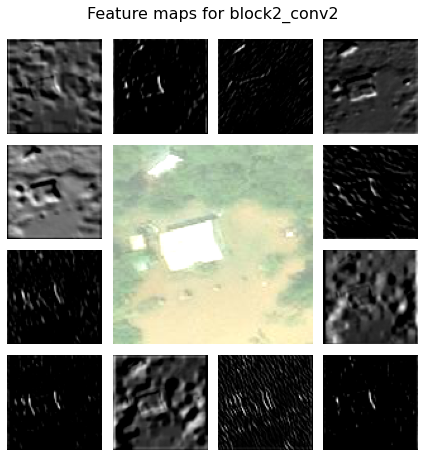

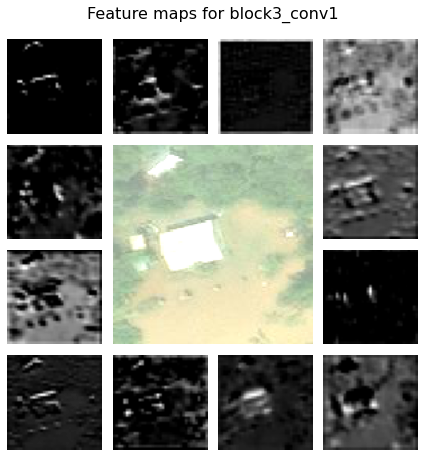

...

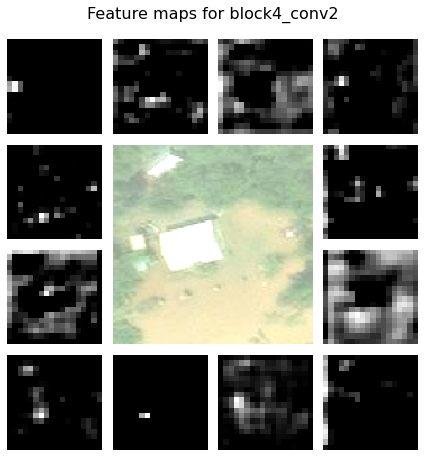

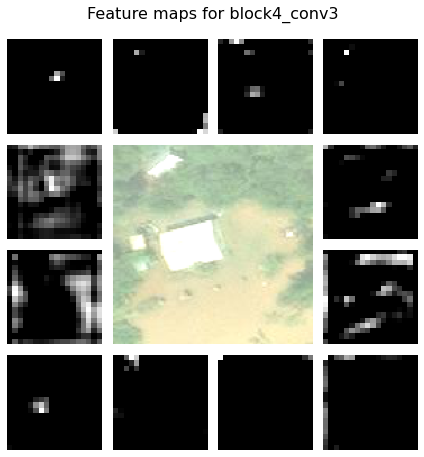

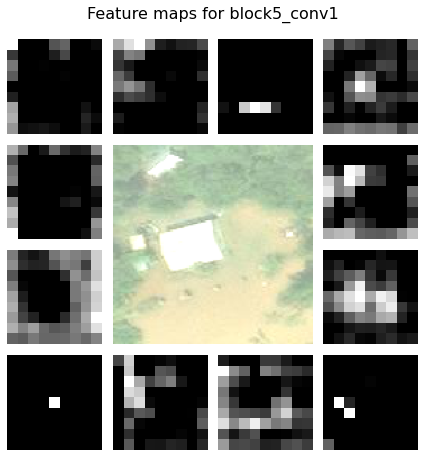

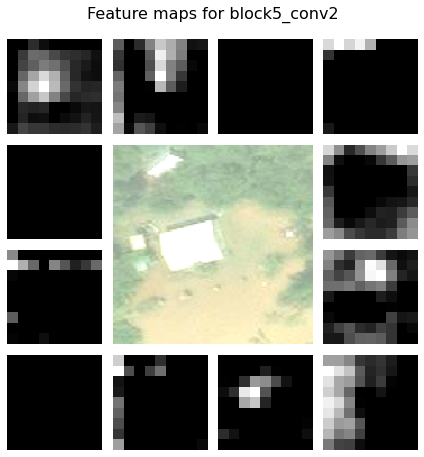

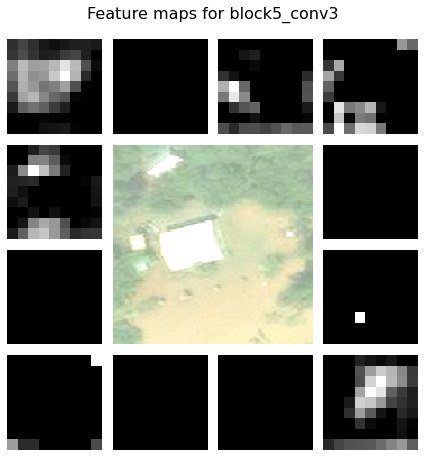

In [50]:
for i in range(1,3):
    layeri_output = model.layers[i].output
    activation_model = tf.keras.Model(model.input,layeri_output)
    activations = activation_model.predict(img_tensor)
    plot_featuremaps(img_tensor,activations,[model.layers[i].name])

for i in range(4,6):
    layeri_output = model.layers[i].output
    activation_model = tf.keras.Model(model.input,layeri_output)
    activations = activation_model.predict(img_tensor)
    plot_featuremaps(img_tensor,activations,[model.layers[i].name])

for i in range(7,10):
    layeri_output = model.layers[i].output
    activation_model = tf.keras.Model(model.input,layeri_output)
    activations = activation_model.predict(img_tensor)
    plot_featuremaps(img_tensor,activations,[model.layers[i].name])
    
for i in range(11,14):
    layeri_output = model.layers[i].output
    activation_model = tf.keras.Model(model.input,layeri_output)
    activations = activation_model.predict(img_tensor)
    plot_featuremaps(img_tensor,activations,[model.layers[i].name])
    
for i in range(15,18):
    layeri_output = model.layers[i].output
    activation_model = tf.keras.Model(model.input,layeri_output)
    activations = activation_model.predict(img_tensor)
    plot_featuremaps(img_tensor,activations,[model.layers[i].name])

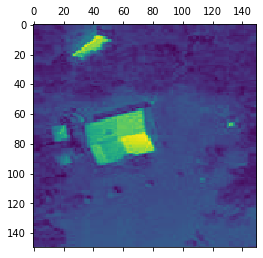

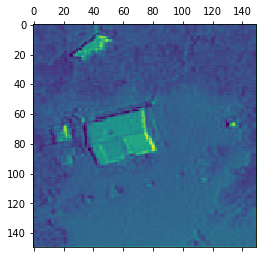

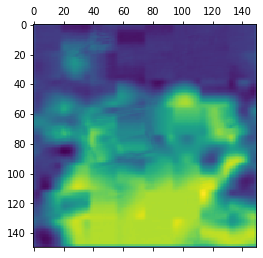

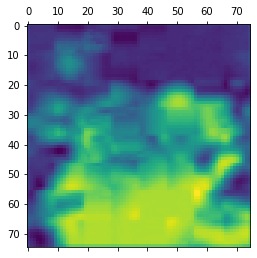

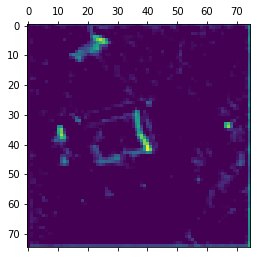

...

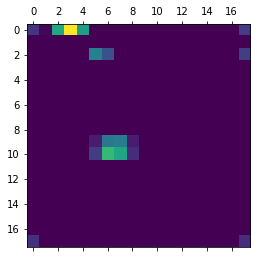

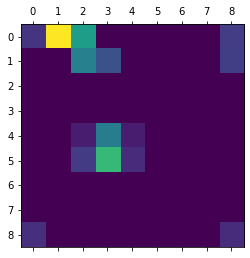

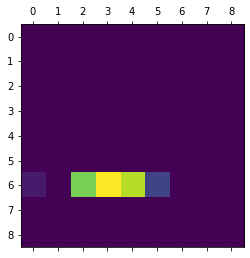

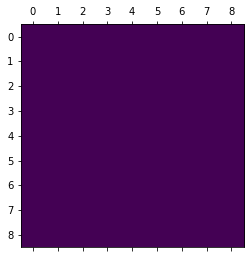

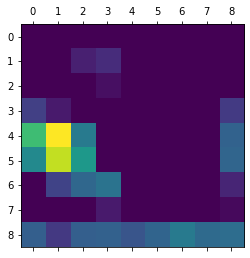

In [51]:
from keras import models
layer_outputs = [layer.output for layer in model.layers[:18]]
activation_model = models.Model(inputs = model.input, outputs = layer_outputs)
#First Layer
activations = activation_model.predict(img_tensor)
# first_layer_activation = activations[0]
# plt.matshow(first_layer_activation[0,:,:,2],cmap = 'viridis')
for i in range(0,18):
    first_layer_activation = activations[i]
    plt.matshow(first_layer_activation[0,:,:,2],cmap = 'viridis')

In [52]:
for layer in conv_base.layers:
  layer.trainable=False
model.compile(loss = 'binary_crossentropy',
       optimizer = optimizers.RMSprop(learning_rate = 2e-5),
#               optimizer = optimizers.RMSprop(lr = 2e-5),
       metrics = ['accuracy'])
history = model.fit( train_generator,
            steps_per_epoch = 100,
            epochs = 50,
            validation_data = validation_generator,
            validation_steps = 50,
            callbacks=[es])

Epoch 1/50
100/100 [==============================] - 36s 306ms/step - loss: 11.6099 - accuracy: 0.7284 - val_loss: 11.1530 - val_accuracy: 0.8581
Epoch 2/50
100/100 [==============================] - 32s 325ms/step - loss: 10.8904 - accuracy: 0.8219 - val_loss: 10.5118 - val_accuracy: 0.8763
Epoch 3/50
100/100 [==============================] - 30s 302ms/step - loss: 10.2892 - accuracy: 0.8334 - val_loss: 9.9312 - val_accuracy: 0.8744
Epoch 4/50
100/100 [==============================] - 31s 305ms/step - loss: 9.7205 - accuracy: 0.8403 - val_loss: 9.3661 - val_accuracy: 0.8881
Epoch 5/50
100/100 [==============================] - 31s 314ms/step - loss: 9.1603 - accuracy: 0.8506 - val_loss: 8.8396 - val_accuracy: 0.8737
Epoch 6/50
100/100 [==============================] - 30s 301ms/step - loss: 8.6355 - accuracy: 0.8566 - val_loss: 8.3185 - val_accuracy: 0.8894
Epoch 7/50
100/100 [==============================] - 30s 302ms/step - loss: 8.1342 - accuracy: 0.8612 - val_loss: 7.8317 - v

In [53]:
#Evaluating with balanced and unbalanced test datsets
test_results = model.evaluate(test_generator)
test_another_results = model.evaluate(test_another_generator)
print("Test accuracy \n Balanced Test set   = {} \n Unbalanced Test set = {}".format(np.around(test_results[1], 3), np.around(test_another_results[1], 3)))

450/450 [==============================] - 55s 122ms/step - loss: 6.1102 - accuracy: 0.8849
Test accuracy 
 Balanced Test set   = 0.875 
 Unbalanced Test set = 0.885


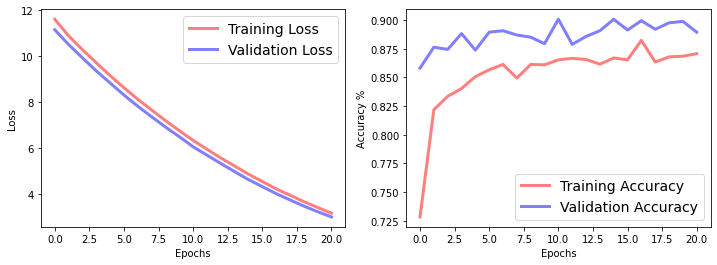

In [54]:
plot_acc(history)

In [55]:
# create the base model from the pre-trained model VGG16
pretrained_model = tf.keras.applications.vgg16.VGG16(input_shape=(150,150,3),include_top=False,weights='imagenet')

# freeze the convolutional base
pretrained_model.trainable = True
pretrained_model.summary()
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
# set the initializers with a seed for reproducible behaviour
prediction_layer = tf.keras.layers.Dense(1,kernel_initializer=tf.keras.initializers.GlorotUniform(seed=1992),
                      bias_initializer=tf.keras.initializers.GlorotUniform(seed=1992))
model = tf.keras.Sequential([pretrained_model,global_average_layer,prediction_layer])

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 150, 150, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 150, 150, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 75, 75, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 75, 75, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 75, 75, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 37, 37, 128)       0     

In [56]:
weights, bias= pretrained_model.layers[1].get_weights()
assert weights.shape == (3,3,3,64), "Computed weights are incorrect"

kernels_filter1 = weights[:,:,:,0]
assert kernels_filter1.shape == (3,3,3)

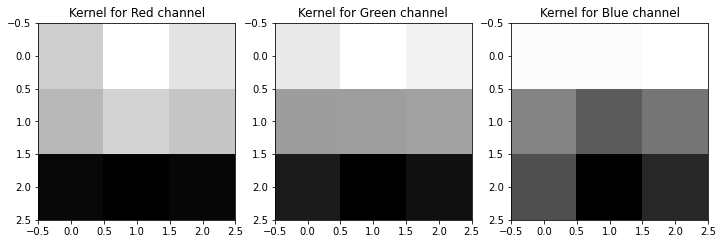

In [57]:
fig, axes = plt.subplots(1,3,figsize = (12,4))
colors = ['Red','Green','Blue']
for num, i in enumerate(axes):
  i.imshow(kernels_filter1[num],cmap='gray')
  i.set_title(f'Kernel for {colors[num]} channel')

Text(0.5, 1.0, '1st Filter of convolution')

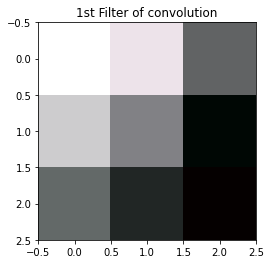

In [58]:
kernels_filter1 = (kernels_filter1 - kernels_filter1.min(axis=(0,1)))/(kernels_filter1.max(axis=(0,1)) - kernels_filter1.min(axis=(0,1)))
fig, ax = plt.subplots(1,1,figsize = (4,4))
ax.imshow(kernels_filter1)
ax.set_title(f'1st Filter of convolution')

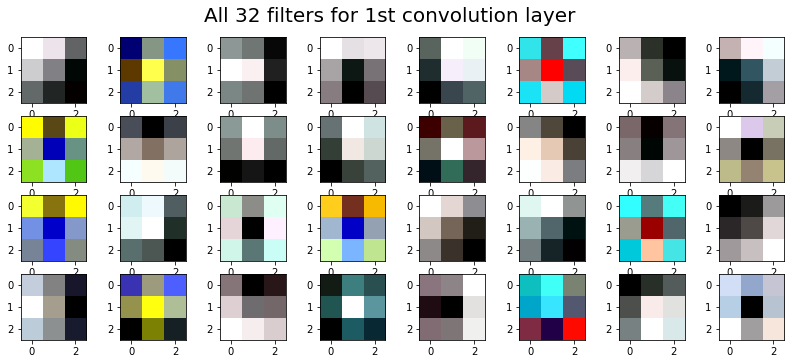

In [59]:
fig,ax=plt.subplots(4,8,figsize=(14,14))
fig.subplots_adjust(bottom=0.2,top=0.5)
for i in range(4):
    for j in range(8):
        filters= weights[:,:,:,(8*i)+j]
        filters = (filters - filters.min(axis=(0,1)))/(filters.max(axis=(0,1)) - filters.min(axis=(0,1)))
        ax[i,j].imshow(filters)
        
fig.suptitle('All 32 filters for 1st convolution layer',fontsize=20, y=0.53);

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

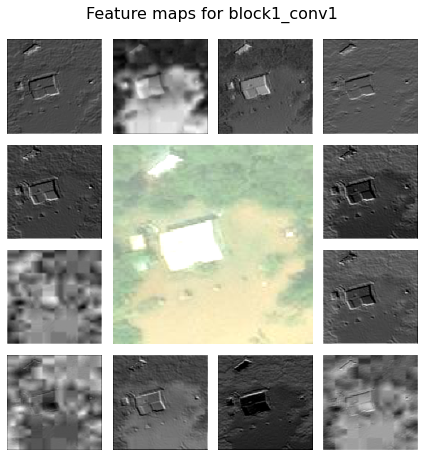

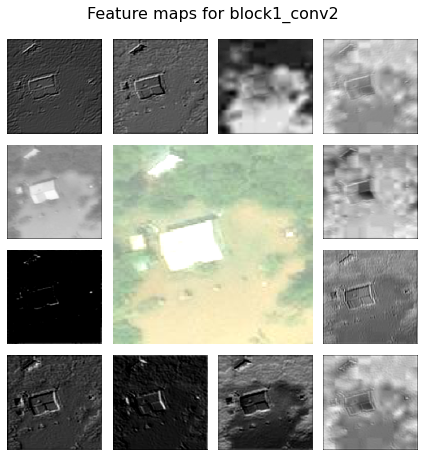

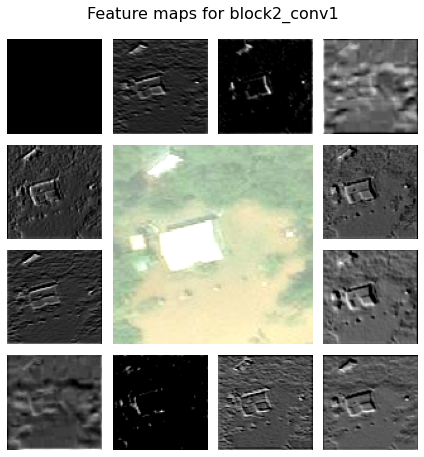

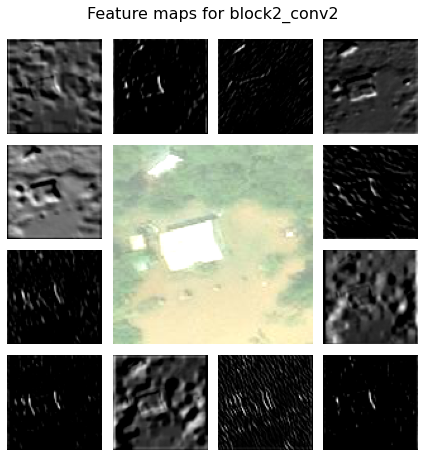

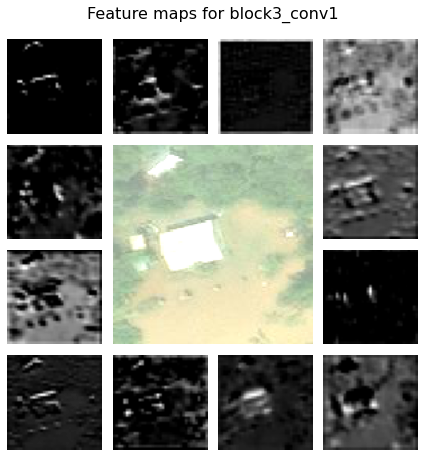

...

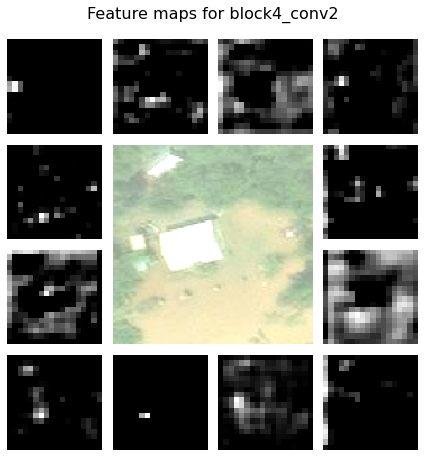

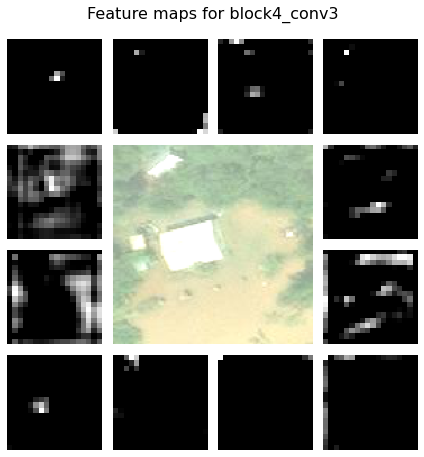

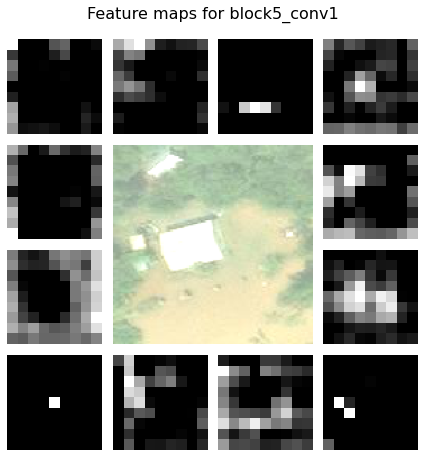

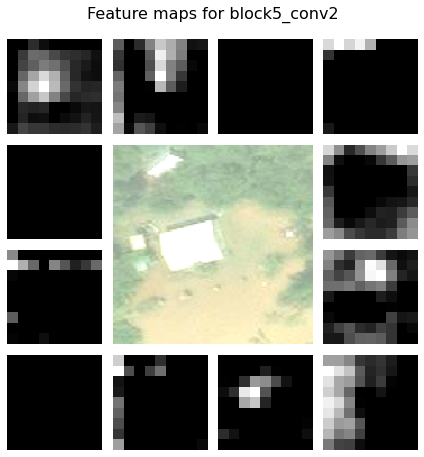

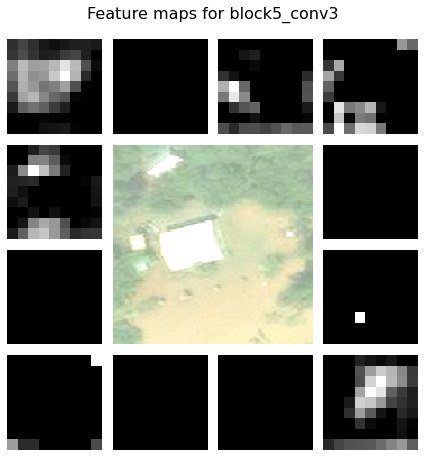

In [60]:
for i in range(1,3):
    layeri_output = pretrained_model.layers[i].output
    activation_model = tf.keras.Model(pretrained_model.input,layeri_output)
    activations = activation_model.predict(img_tensor)
    plot_featuremaps(img_tensor,activations,[pretrained_model.layers[i].name])

for i in range(4,6):
    layeri_output = pretrained_model.layers[i].output
    activation_model = tf.keras.Model(pretrained_model.input,layeri_output)
    activations = activation_model.predict(img_tensor)
    plot_featuremaps(img_tensor,activations,[pretrained_model.layers[i].name])

for i in range(7,10):
    layeri_output = pretrained_model.layers[i].output
    activation_model = tf.keras.Model(pretrained_model.input,layeri_output)
    activations = activation_model.predict(img_tensor)
    plot_featuremaps(img_tensor,activations,[pretrained_model.layers[i].name])
    
for i in range(11,14):
    layeri_output = pretrained_model.layers[i].output
    activation_model = tf.keras.Model(pretrained_model.input,layeri_output)
    activations = activation_model.predict(img_tensor)
    plot_featuremaps(img_tensor,activations,[pretrained_model.layers[i].name])
    
for i in range(15,18):
    layeri_output = pretrained_model.layers[i].output
    activation_model = tf.keras.Model(pretrained_model.input,layeri_output)
    activations = activation_model.predict(img_tensor)
    plot_featuremaps(img_tensor,activations,[pretrained_model.layers[i].name])

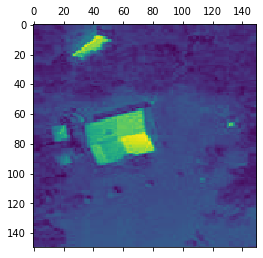

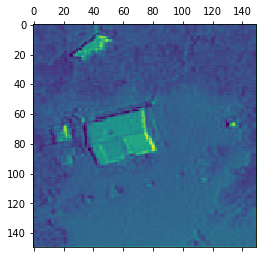

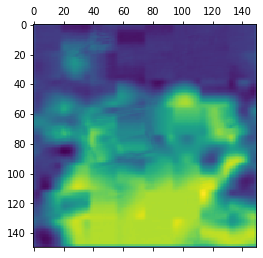

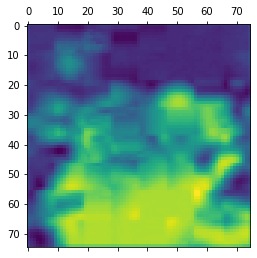

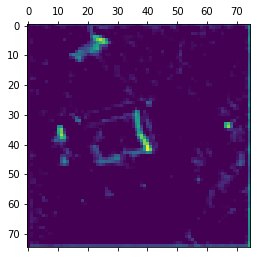

...

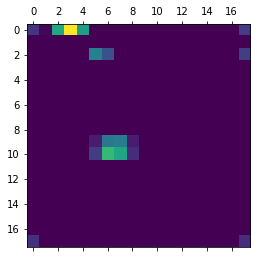

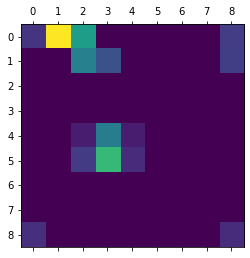

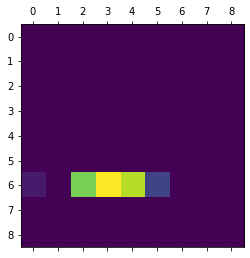

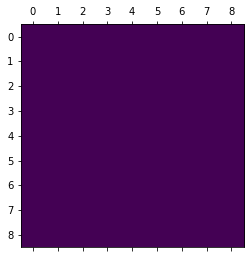

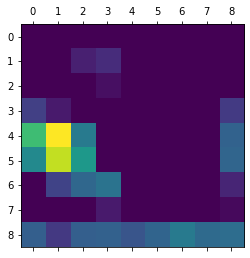

In [61]:
from keras import models
layer_outputs = [layer.output for layer in pretrained_model.layers[:18]]
activation_model = models.Model(inputs = pretrained_model.input, outputs = layer_outputs)
#First Layer
activations = activation_model.predict(img_tensor)
# first_layer_activation = activations[0]
# plt.matshow(first_layer_activation[0,:,:,2],cmap = 'viridis')
for i in range(0,18):
    first_layer_activation = activations[i]
    plt.matshow(first_layer_activation[0,:,:,2],cmap = 'viridis')

In [62]:
# fine-tune from this layer onwards
fine_tune_at = 15

# freeze all the layers before the `fine_tune_at` layer
for layer in pretrained_model.layers[:fine_tune_at]:
  layer.trainable =  False

In [63]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate/75),
#               optimizer=tf.keras.optimizers.Adam(lr=base_learning_rate/75),
       loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
       metrics=['accuracy'])
history = model.fit(train_generator,epochs=100,
           initial_epoch=15,
           validation_data=validation_generator,
           validation_steps=20,
           callbacks=[es])

Epoch 16/100
313/313 [==============================] - 81s 254ms/step - loss: 0.5360 - accuracy: 0.7511 - val_loss: 0.3803 - val_accuracy: 0.8297
Epoch 17/100
313/313 [==============================] - 80s 255ms/step - loss: 0.3522 - accuracy: 0.8455 - val_loss: 0.2893 - val_accuracy: 0.8906
Epoch 18/100
313/313 [==============================] - 79s 253ms/step - loss: 0.3134 - accuracy: 0.8612 - val_loss: 0.2364 - val_accuracy: 0.9141
Epoch 19/100
313/313 [==============================] - 79s 253ms/step - loss: 0.2929 - accuracy: 0.8714 - val_loss: 0.2565 - val_accuracy: 0.9047
Epoch 20/100
313/313 [==============================] - 79s 253ms/step - loss: 0.2841 - accuracy: 0.8734 - val_loss: 0.2366 - val_accuracy: 0.9031
Epoch 21/100
313/313 [==============================] - 79s 253ms/step - loss: 0.2689 - accuracy: 0.8806 - val_loss: 0.1964 - val_accuracy: 0.9219
Epoch 22/100
313/313 [==============================] - 79s 253ms/step - loss: 0.2540 - accuracy: 0.8865 - val_loss: 0

In [64]:
#Evaluating with balanced and unbalanced test datsets
test_results = model.evaluate(test_generator)
test_another_results = model.evaluate(test_another_generator)
print("Test accuracy \n Balanced Test set = {} \n Unbalanced Test set = {}".format(np.around(test_results[1], 3), np.around(test_another_results[1], 3)))

450/450 [==============================] - 54s 121ms/step - loss: 0.1445 - accuracy: 0.9614
Test accuracy 
 Balanced Test set = 0.945 
 Unbalanced Test set = 0.961


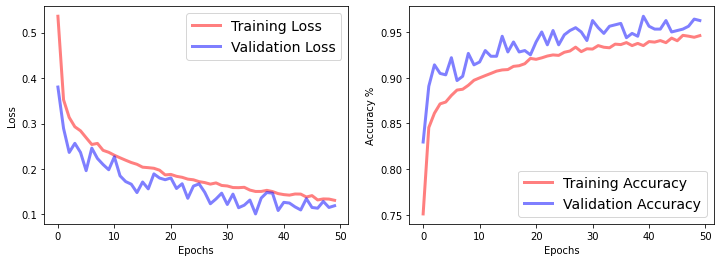

In [65]:
plot_acc(history)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

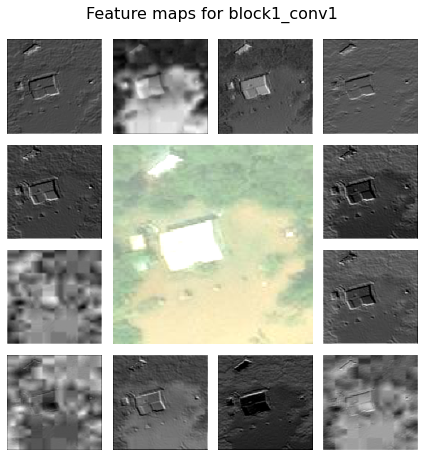

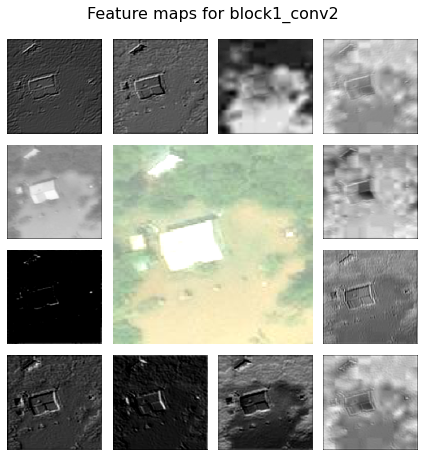

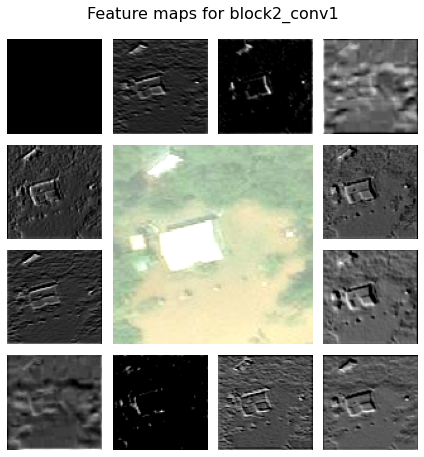

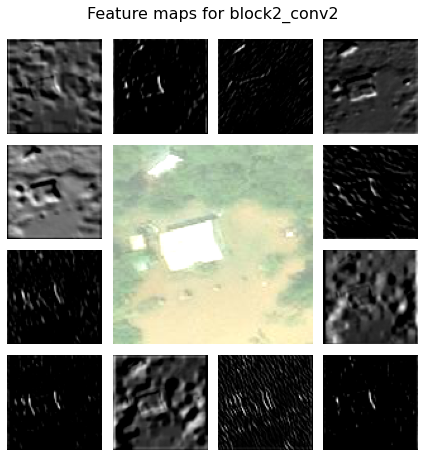

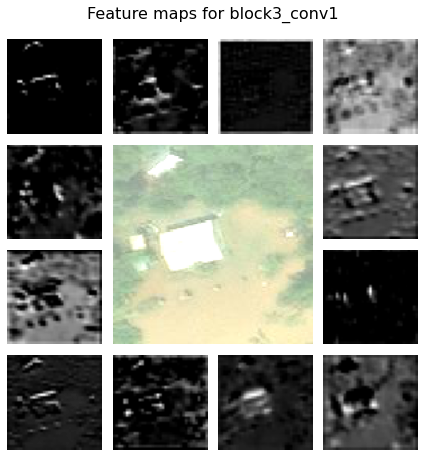

...

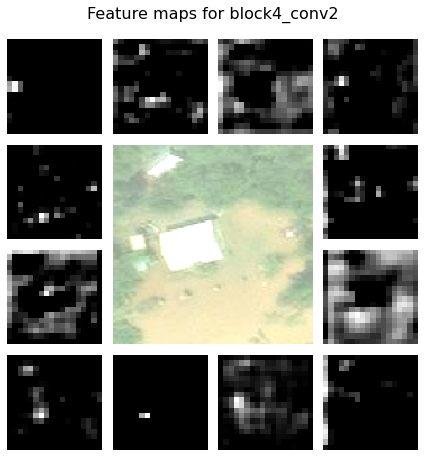

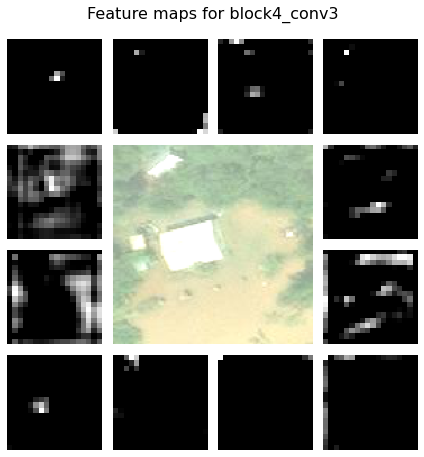

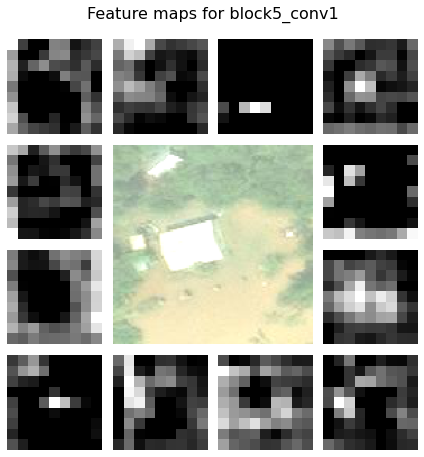

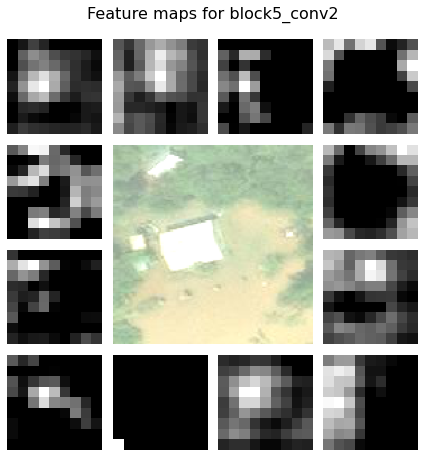

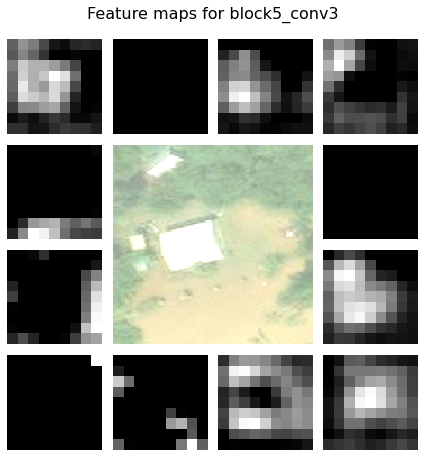

In [66]:
for i in range(1,3):
    layeri_output = pretrained_model.layers[i].output
    activation_model = tf.keras.Model(pretrained_model.input,layeri_output)
    activations = activation_model.predict(img_tensor)
    plot_featuremaps(img_tensor,activations,[pretrained_model.layers[i].name])

for i in range(4,6):
    layeri_output = pretrained_model.layers[i].output
    activation_model = tf.keras.Model(pretrained_model.input,layeri_output)
    activations = activation_model.predict(img_tensor)
    plot_featuremaps(img_tensor,activations,[pretrained_model.layers[i].name])

for i in range(7,10):
    layeri_output = pretrained_model.layers[i].output
    activation_model = tf.keras.Model(pretrained_model.input,layeri_output)
    activations = activation_model.predict(img_tensor)
    plot_featuremaps(img_tensor,activations,[pretrained_model.layers[i].name])
    
for i in range(11,14):
    layeri_output = pretrained_model.layers[i].output
    activation_model = tf.keras.Model(pretrained_model.input,layeri_output)
    activations = activation_model.predict(img_tensor)
    plot_featuremaps(img_tensor,activations,[pretrained_model.layers[i].name])
    
for i in range(15,18):
    layeri_output = pretrained_model.layers[i].output
    activation_model = tf.keras.Model(pretrained_model.input,layeri_output)
    activations = activation_model.predict(img_tensor)
    plot_featuremaps(img_tensor,activations,[pretrained_model.layers[i].name])

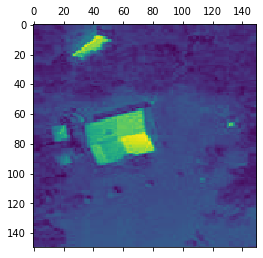

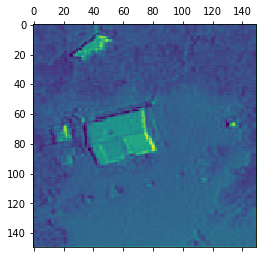

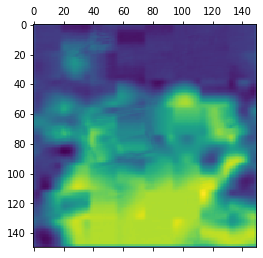

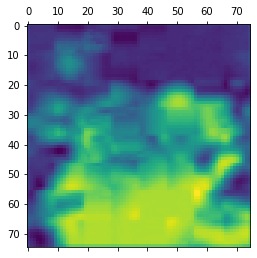

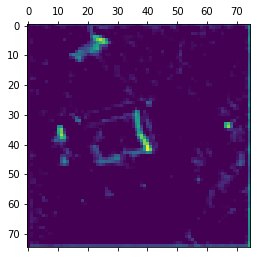

...

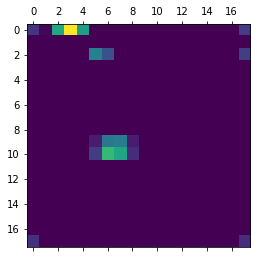

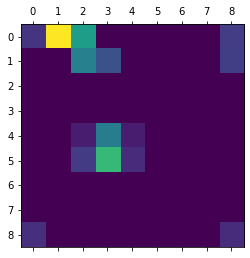

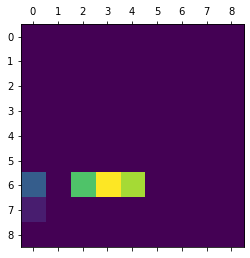

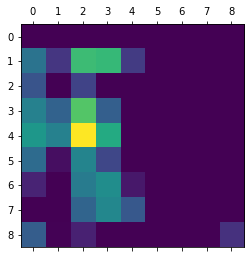

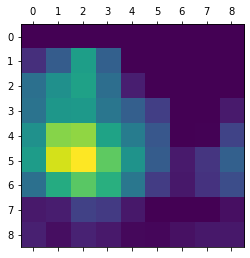

In [67]:
from keras import models
layer_outputs = [layer.output for layer in pretrained_model.layers[:18]]
activation_model = models.Model(inputs = pretrained_model.input, outputs = layer_outputs)
#First Layer
activations = activation_model.predict(img_tensor)
# first_layer_activation = activations[0]
# plt.matshow(first_layer_activation[0,:,:,2],cmap = 'viridis')
for i in range(0,18):
    first_layer_activation = activations[i]
    plt.matshow(first_layer_activation[0,:,:,2],cmap = 'viridis')

In [68]:
#Using VGG19
from keras.applications.vgg19 import VGG19
from keras.layers import Flatten,Dense,Dropout,Input
from keras.models import Model 
from keras.utils import np_utils
import tensorflow as tf
conv_base = VGG19(weights = 'imagenet',
          include_top = False, #no dense layers
          input_shape = (150,150,3))
regularizer = tf.keras.regularizers.l2(0.1)
conv_base.summary()

80150528/80134624 [==============================] - 1s 0us/step
Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 150, 150, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 150, 150, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 75, 75, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 75, 75, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 75, 75, 128)       147584    
                                                              

In [69]:
x=conv_base.output
x=Flatten()(x)
x=Dense(units=256,activation="relu")(x)
x=Dropout(0.5)(x)
x=Dense(units=1,activation="sigmoid")(x)
model=Model(conv_base.input,x)
model.summary()

Model: "model_63"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 150, 150, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 150, 150, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 75, 75, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 75, 75, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 75, 75, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 37, 37, 128)       0  

In [70]:
weights, bias= conv_base.layers[1].get_weights()
assert weights.shape == (3,3,3,64), "Computed weights are incorrect"

kernels_filter1 = weights[:,:,:,0]
assert kernels_filter1.shape == (3,3,3)

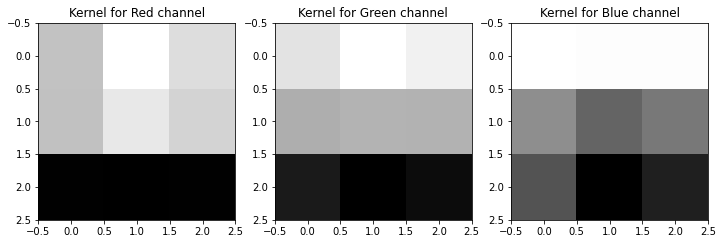

In [71]:
fig, axes = plt.subplots(1,3,figsize = (12,4))
colors = ['Red','Green','Blue']
for num, i in enumerate(axes):
  i.imshow(kernels_filter1[num],cmap='gray')
  i.set_title(f'Kernel for {colors[num]} channel')

Text(0.5, 1.0, '1st Filter of convolution')

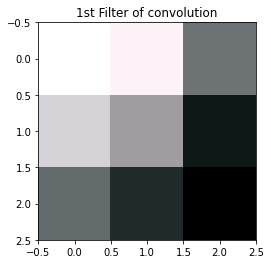

In [72]:
kernels_filter1 = (kernels_filter1 - kernels_filter1.min(axis=(0,1)))/(kernels_filter1.max(axis=(0,1)) - kernels_filter1.min(axis=(0,1)))
fig, ax = plt.subplots(1,1,figsize = (4,4))
ax.imshow(kernels_filter1)
ax.set_title(f'1st Filter of convolution')

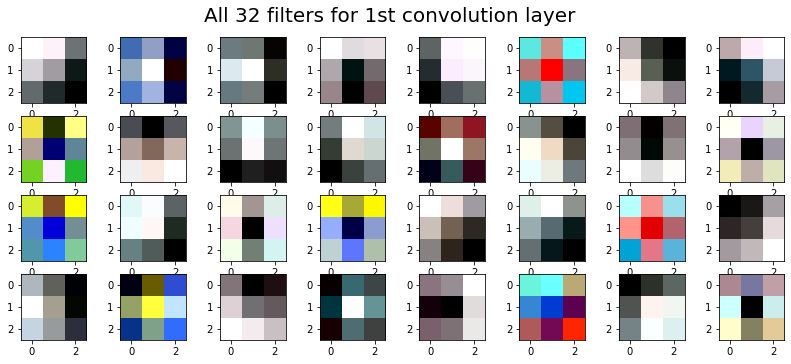

In [73]:
fig,ax=plt.subplots(4,8,figsize=(14,14))
fig.subplots_adjust(bottom=0.2,top=0.5)
for i in range(4):
    for j in range(8):
        filters= weights[:,:,:,(8*i)+j]
        filters = (filters - filters.min(axis=(0,1)))/(filters.max(axis=(0,1)) - filters.min(axis=(0,1)))
        ax[i,j].imshow(filters)
        
fig.suptitle('All 32 filters for 1st convolution layer',fontsize=20, y=0.53); 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

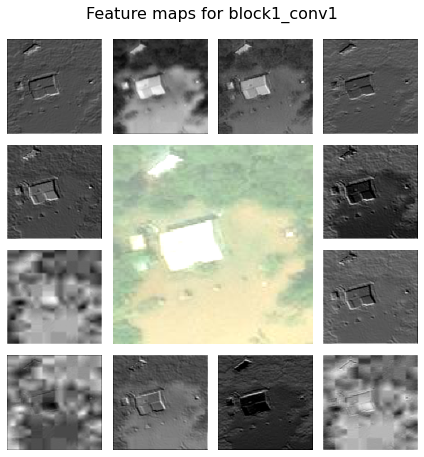

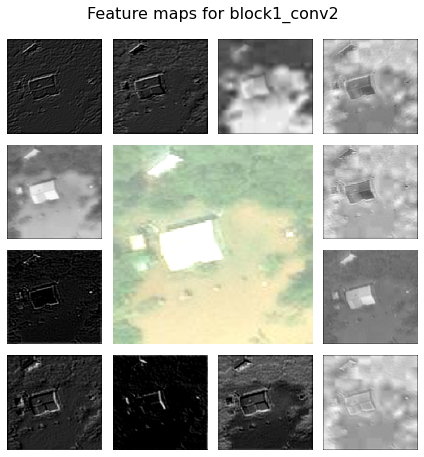

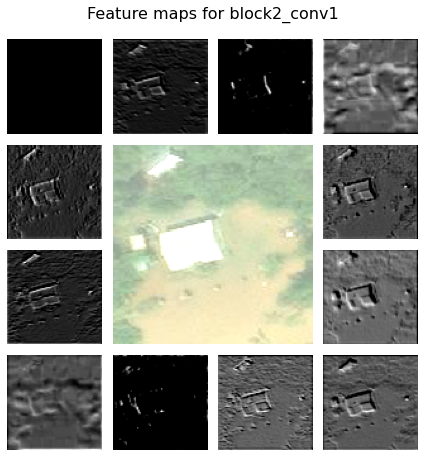

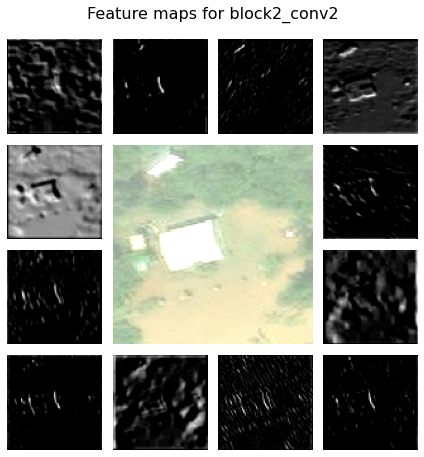

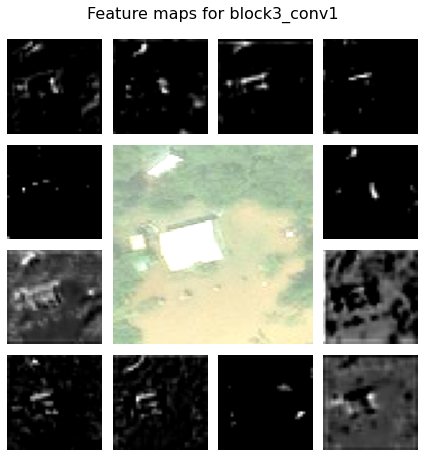

...

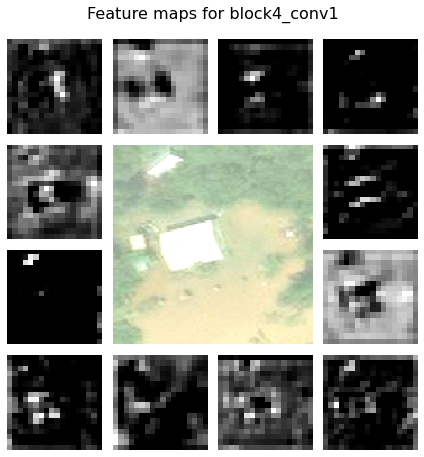

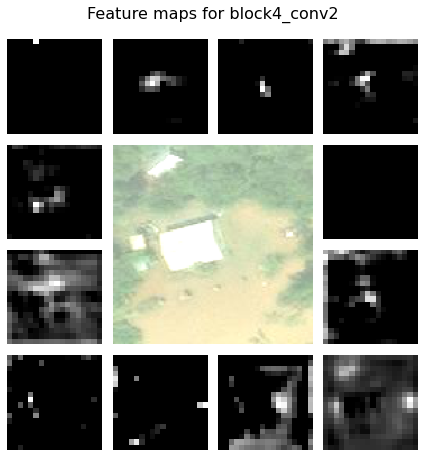

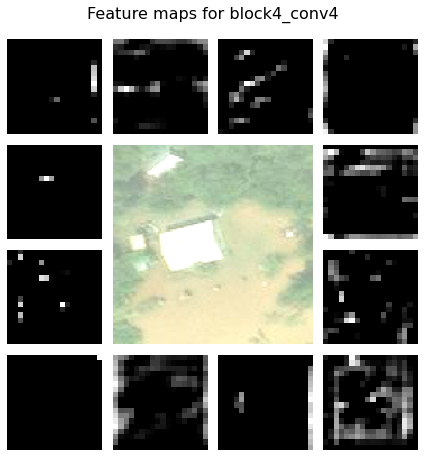

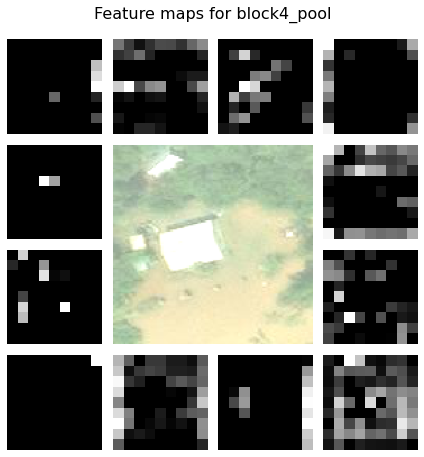

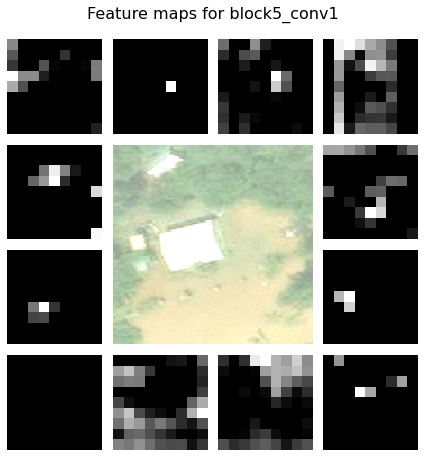

In [74]:
for i in range(1,3):
    layeri_output = conv_base.layers[i].output
    activation_model = tf.keras.Model(conv_base.input,layeri_output)
    activations = activation_model.predict(img_tensor)
    plot_featuremaps(img_tensor,activations,[conv_base.layers[i].name])

for i in range(4,6):
    layeri_output = conv_base.layers[i].output
    activation_model = tf.keras.Model(conv_base.input,layeri_output)
    activations = activation_model.predict(img_tensor)
    plot_featuremaps(img_tensor,activations,[conv_base.layers[i].name])

for i in range(7,10):
    layeri_output = conv_base.layers[i].output
    activation_model = tf.keras.Model(conv_base.input,layeri_output)
    activations = activation_model.predict(img_tensor)
    plot_featuremaps(img_tensor,activations,[conv_base.layers[i].name])
    
for i in range(11,14):
    layeri_output = conv_base.layers[i].output
    activation_model = tf.keras.Model(conv_base.input,layeri_output)
    activations = activation_model.predict(img_tensor)
    plot_featuremaps(img_tensor,activations,[conv_base.layers[i].name])
    
for i in range(15,18):
    layeri_output = conv_base.layers[i].output
    activation_model = tf.keras.Model(conv_base.input,layeri_output)
    activations = activation_model.predict(img_tensor)
    plot_featuremaps(img_tensor,activations,[conv_base.layers[i].name])

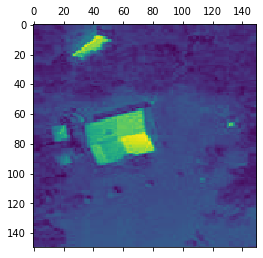

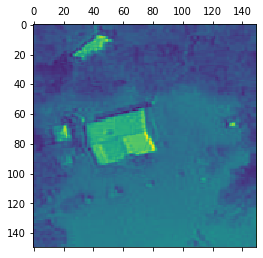

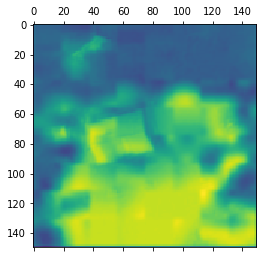

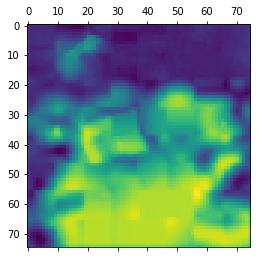

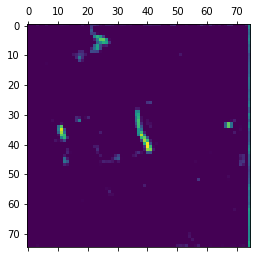

...

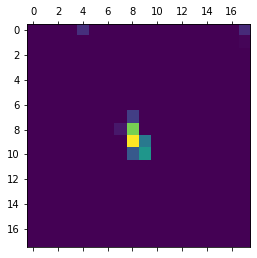

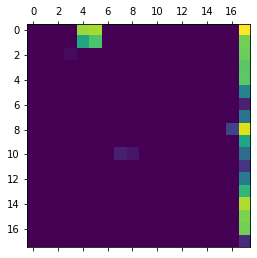

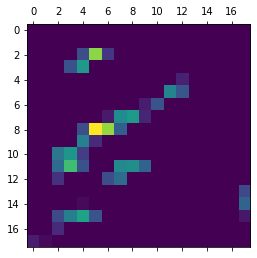

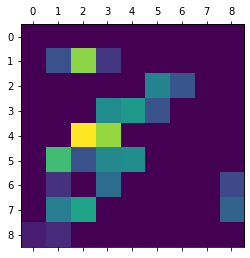

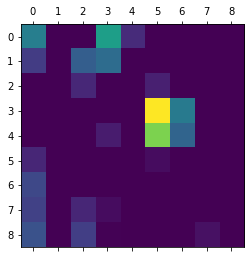

In [75]:
from keras import models
layer_outputs = [layer.output for layer in conv_base.layers[:18]]
activation_model = models.Model(inputs = conv_base.input, outputs = layer_outputs)
#First Layer
activations = activation_model.predict(img_tensor)
# first_layer_activation = activations[0]
# plt.matshow(first_layer_activation[0,:,:,2],cmap = 'viridis')
for i in range(0,18):
    first_layer_activation = activations[i]
    plt.matshow(first_layer_activation[0,:,:,2],cmap = 'viridis')

In [76]:
for layer in conv_base.layers:
  layer.trainable=False
model.compile(loss = 'binary_crossentropy',
       optimizer = optimizers.RMSprop(learning_rate = 2e-4),
#               optimizer = optimizers.RMSprop(lr = 2e-4),
       metrics = ['accuracy'])
history = model.fit_generator( train_generator,
            steps_per_epoch = 100,
            epochs = 50,
            validation_data = validation_generator,
            validation_steps = 50,
            callbacks=[es])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  if sys.path[0] == '':


Epoch 1/50
100/100 [==============================] - 34s 327ms/step - loss: 0.4976 - accuracy: 0.7766 - val_loss: 0.3477 - val_accuracy: 0.8550
Epoch 2/50
100/100 [==============================] - 32s 320ms/step - loss: 0.4107 - accuracy: 0.8219 - val_loss: 0.4085 - val_accuracy: 0.8125
Epoch 3/50
100/100 [==============================] - 32s 320ms/step - loss: 0.3635 - accuracy: 0.8450 - val_loss: 0.3002 - val_accuracy: 0.8769
Epoch 4/50
100/100 [==============================] - 32s 322ms/step - loss: 0.3748 - accuracy: 0.8306 - val_loss: 0.3548 - val_accuracy: 0.8419
Epoch 5/50
100/100 [==============================] - 32s 318ms/step - loss: 0.3605 - accuracy: 0.8444 - val_loss: 0.2994 - val_accuracy: 0.8694
Epoch 6/50
100/100 [==============================] - 32s 316ms/step - loss: 0.3455 - accuracy: 0.8453 - val_loss: 0.2831 - val_accuracy: 0.8825
Epoch 7/50
100/100 [==============================] - 32s 323ms/step - loss: 0.3478 - accuracy: 0.8506 - val_loss: 0.3059 - val_ac

In [77]:
#Evaluating with balanced and unbalanced test datsets
test_results = model.evaluate(test_generator)
test_another_results = model.evaluate(test_another_generator)
print("Test accuracy \n Balanced Test set   = {} \n Unbalanced Test set = {}".format(np.around(test_results[1], 3), np.around(test_another_results[1], 3)))

450/450 [==============================] - 65s 145ms/step - loss: 0.2358 - accuracy: 0.9091
Test accuracy 
 Balanced Test set   = 0.896 
 Unbalanced Test set = 0.909


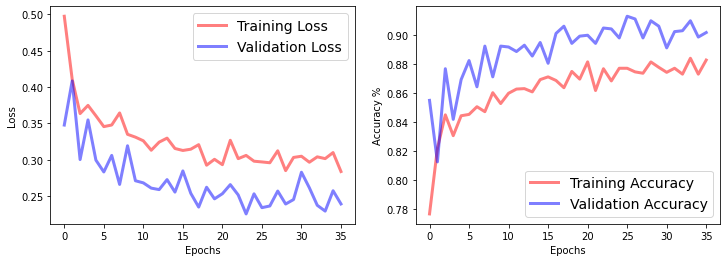

In [78]:
plot_acc(history)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

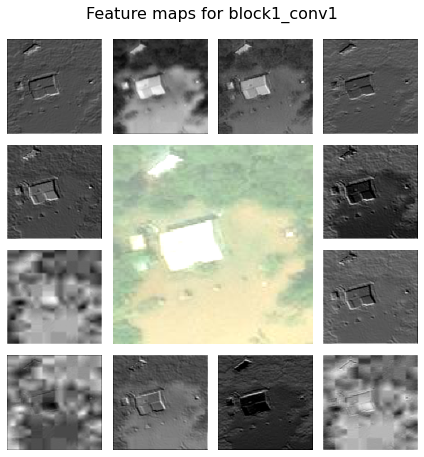

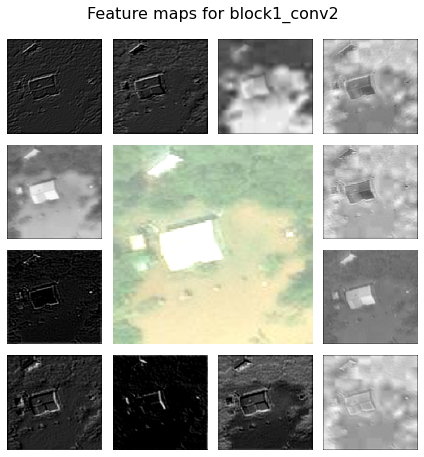

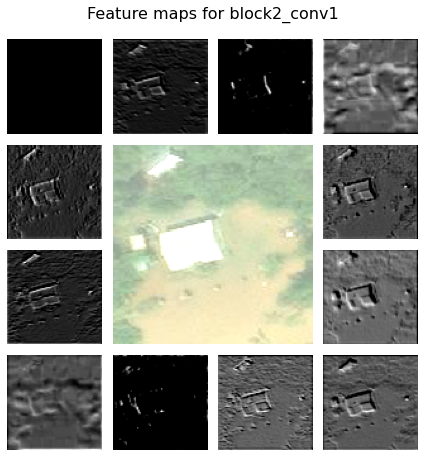

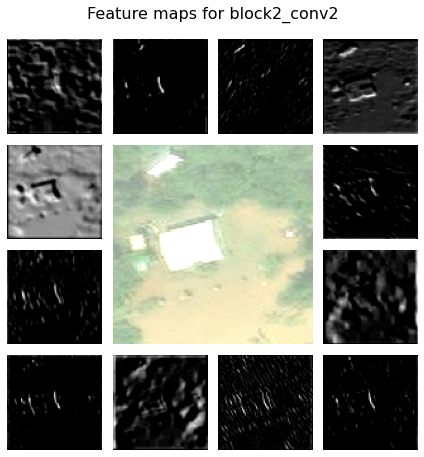

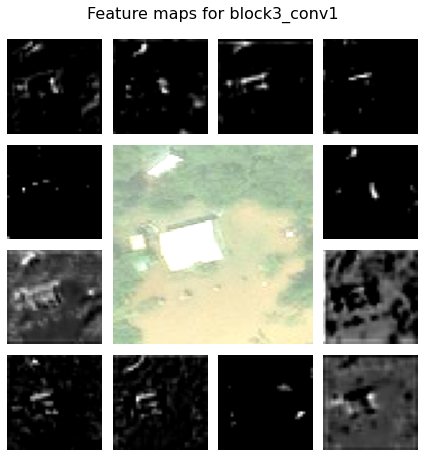

...

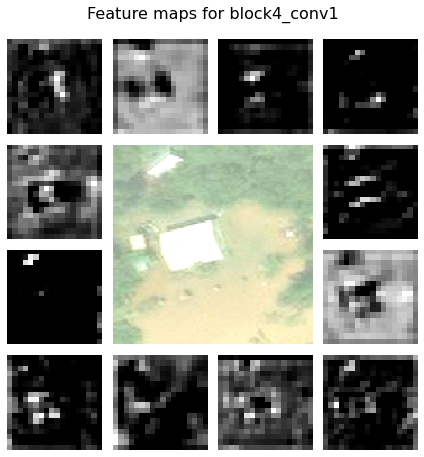

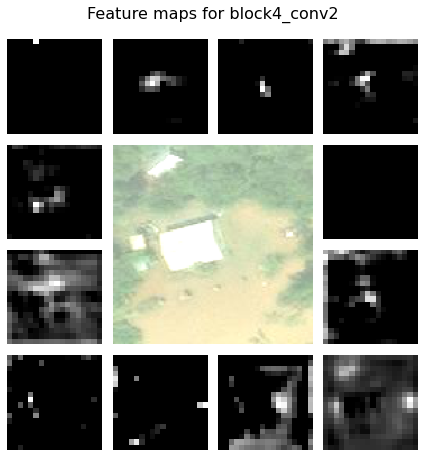

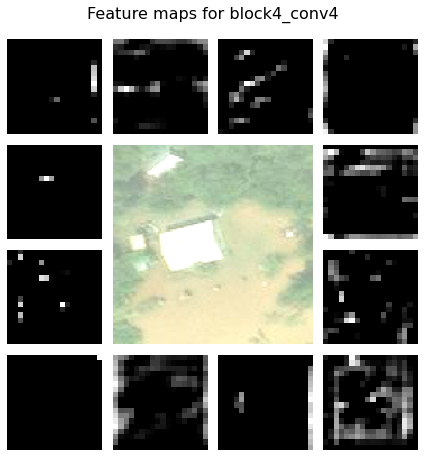

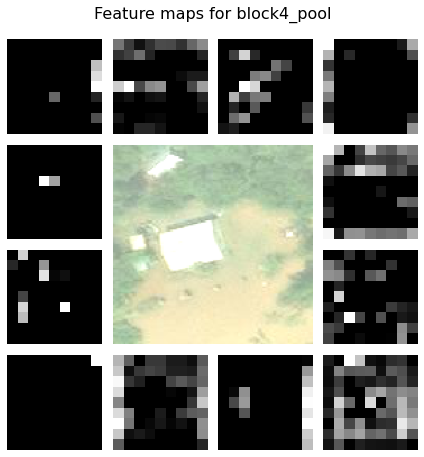

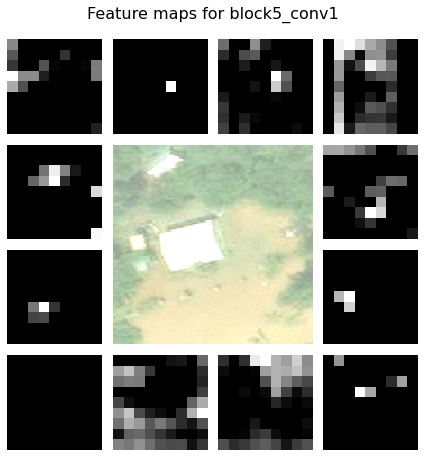

In [79]:
for i in range(1,3):
    layeri_output = conv_base.layers[i].output
    activation_model = tf.keras.Model(conv_base.input,layeri_output)
    activations = activation_model.predict(img_tensor)
    plot_featuremaps(img_tensor,activations,[conv_base.layers[i].name])

for i in range(4,6):
    layeri_output = conv_base.layers[i].output
    activation_model = tf.keras.Model(conv_base.input,layeri_output)
    activations = activation_model.predict(img_tensor)
    plot_featuremaps(img_tensor,activations,[conv_base.layers[i].name])

for i in range(7,10):
    layeri_output = conv_base.layers[i].output
    activation_model = tf.keras.Model(conv_base.input,layeri_output)
    activations = activation_model.predict(img_tensor)
    plot_featuremaps(img_tensor,activations,[conv_base.layers[i].name])
    
for i in range(11,14):
    layeri_output = conv_base.layers[i].output
    activation_model = tf.keras.Model(conv_base.input,layeri_output)
    activations = activation_model.predict(img_tensor)
    plot_featuremaps(img_tensor,activations,[conv_base.layers[i].name])
    
for i in range(15,18):
    layeri_output = conv_base.layers[i].output
    activation_model = tf.keras.Model(conv_base.input,layeri_output)
    activations = activation_model.predict(img_tensor)
    plot_featuremaps(img_tensor,activations,[conv_base.layers[i].name])

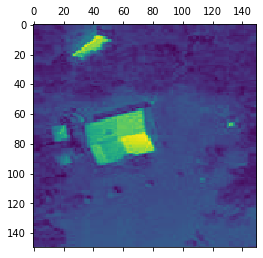

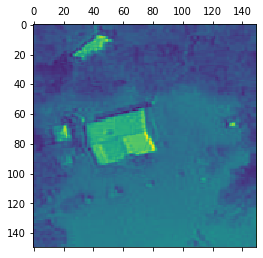

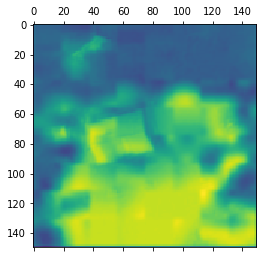

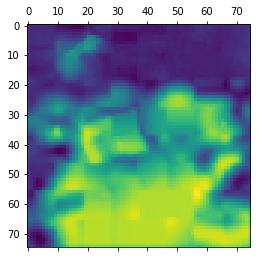

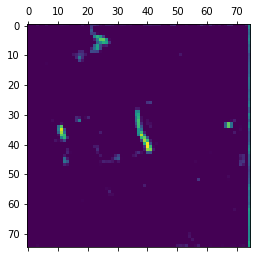

...

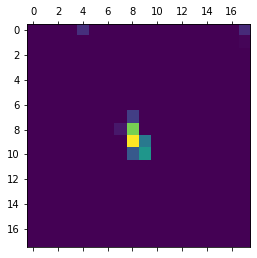

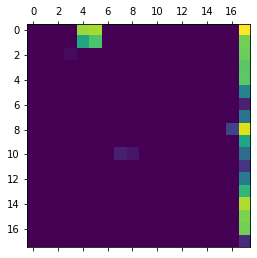

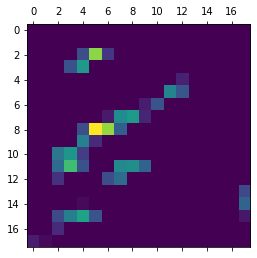

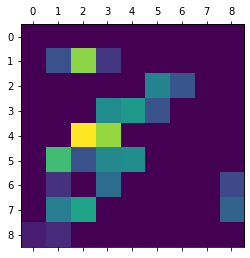

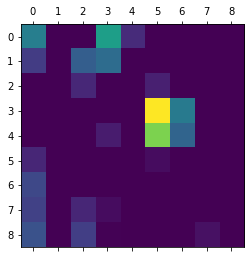

In [80]:
from keras import models
layer_outputs = [layer.output for layer in conv_base.layers[:18]]
activation_model = models.Model(inputs = conv_base.input, outputs = layer_outputs)
#First Layer
activations = activation_model.predict(img_tensor)
# first_layer_activation = activations[0]
# plt.matshow(first_layer_activation[0,:,:,2],cmap = 'viridis')
for i in range(0,18):
    first_layer_activation = activations[i]
    plt.matshow(first_layer_activation[0,:,:,2],cmap = 'viridis')

In [81]:
# create the base model from the pre-trained model VGG16
pretrained_model = tf.keras.applications.mobilenet_v2.MobileNetV2(input_shape=(150,150,3),include_top=False,weights='imagenet')

# freeze the convolutional base
pretrained_model.trainable = True
pretrained_model.summary()
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
# set the initializers with a seed for reproducible behaviour
prediction_layer = tf.keras.layers.Dense(1,kernel_initializer=tf.keras.initializers.GlorotUniform(seed=1992),
                      bias_initializer=tf.keras.initializers.GlorotUniform(seed=1992))
model = tf.keras.Sequential([pretrained_model,global_average_layer,prediction_layer])

9420800/9406464 [==============================] - 0s 0us/step
Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 150, 150, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 75, 75, 32)   864         ['input_4[0][0]']                
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 75, 75, 32)   128         ['Conv1[0][0]']                  
                                                                                                  
 Conv1_relu (ReL

In [82]:
# fine-tune from this layer onwards
fine_tune_at = 15

# freeze all the layers before the `fine_tune_at` layer
for layer in pretrained_model.layers[:fine_tune_at]:
  layer.trainable =  False

In [83]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
#               optimizer=tf.keras.optimizers.Adam(lr=base_learning_rate),
       loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
       metrics=['accuracy'])
history = model.fit(train_generator,epochs=100,
           validation_data=validation_generator,
           validation_steps=20,
           callbacks=[es])

Epoch 1/100
313/313 [==============================] - 83s 243ms/step - loss: 0.2019 - accuracy: 0.9177 - val_loss: 3.8644 - val_accuracy: 0.4719
Epoch 2/100
313/313 [==============================] - 75s 241ms/step - loss: 0.1066 - accuracy: 0.9561 - val_loss: 1.2262 - val_accuracy: 0.5703
Epoch 3/100
313/313 [==============================] - 75s 239ms/step - loss: 0.0893 - accuracy: 0.9609 - val_loss: 0.7157 - val_accuracy: 0.7172
Epoch 4/100
313/313 [==============================] - 75s 239ms/step - loss: 0.0759 - accuracy: 0.9695 - val_loss: 1.3650 - val_accuracy: 0.6187
Epoch 5/100
313/313 [==============================] - 76s 241ms/step - loss: 0.0621 - accuracy: 0.9753 - val_loss: 1.5835 - val_accuracy: 0.5734
Epoch 6/100
313/313 [==============================] - 77s 245ms/step - loss: 0.0556 - accuracy: 0.9775 - val_loss: 0.4151 - val_accuracy: 0.8500
Epoch 7/100
313/313 [==============================] - 77s 247ms/step - loss: 0.0508 - accuracy: 0.9778 - val_loss: 0.1051 -

In [84]:
#Evaluating with balanced and unbalanced test datsets
test_results = model.evaluate(test_generator)
test_another_results = model.evaluate(test_another_generator)
print("Test accuracy \n Balanced Test set   = {} \n Unbalanced Test set = {}".format(np.around(test_results[1], 3), np.around(test_another_results[1], 3)))

450/450 [==============================] - 15s 34ms/step - loss: 0.0541 - accuracy: 0.9817
Test accuracy 
 Balanced Test set   = 0.98 
 Unbalanced Test set = 0.982


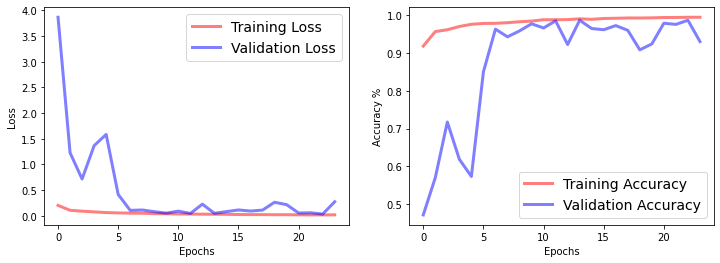

In [85]:
plot_acc(history)


In [86]:
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2
import tensorflow as tf
from keras import models
from keras import layers
conv_base = MobileNetV2(weights = 'imagenet',
                    include_top = False, #no dense layers
                    input_shape = (150,150,3))
regularizer = tf.keras.regularizers.l2(0.1)
model = models.Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(256,activation='relu', kernel_regularizer=regularizer))
model.add(layers.Dense(1,activation = 'sigmoid'))
model.summary()
conv_base.trainable = False #freeze the convolutional base network
# fine-tune from this layer onwards
#fine_tune_at = 15
# freeze all the layers before the `fine_tune_at` layer
#for layer in pretrained_model.layers[:fine_tune_at]:
#  layer.trainable =  False

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Funct  (None, 5, 5, 1280)       2257984   
 ional)                                                          
                                                                 
 flatten_4 (Flatten)         (None, 32000)             0         
                                                                 
 dense_11 (Dense)            (None, 256)               8192256   
                                                                 
 dense_12 (Dense)            (None, 1)                 257       
                                                                 
Total params: 10,450,497
Trainable params: 10,416,385
Non-trainable params: 34,112
_________________________________________________________________


In [87]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate = 2e-4),
#               optimizer=tf.keras.optimizers.RMSprop(lr = 2e-4),
       loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
       metrics=['accuracy'])
history = model.fit( train_generator,
            steps_per_epoch = 100,
            epochs = 100,
            validation_data = validation_generator,
            validation_steps = 50, callbacks=[es])

Epoch 1/100


/usr/local/lib/python3.7/dist-packages/tensorflow/python/util/dispatch.py:1096: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


100/100 [==============================] - 27s 243ms/step - loss: 13.9731 - accuracy: 0.7688 - val_loss: 2.3257 - val_accuracy: 0.7406
Epoch 2/100
100/100 [==============================] - 23s 225ms/step - loss: 1.9082 - accuracy: 0.7681 - val_loss: 2.4373 - val_accuracy: 0.6488
Epoch 3/100
100/100 [==============================] - 23s 231ms/step - loss: 1.8529 - accuracy: 0.7764 - val_loss: 2.3086 - val_accuracy: 0.6806
Epoch 4/100
100/100 [==============================] - 23s 231ms/step - loss: 1.6440 - accuracy: 0.7933 - val_loss: 3.0040 - val_accuracy: 0.6819
Epoch 5/100
100/100 [==============================] - 23s 231ms/step - loss: 1.3855 - accuracy: 0.7925 - val_loss: 0.6053 - val_accuracy: 0.9013
Epoch 6/100
100/100 [==============================] - 22s 223ms/step - loss: 1.3224 - accuracy: 0.7814 - val_loss: 0.7403 - val_accuracy: 0.8719
Epoch 7/100
100/100 [==============================] - 24s 239ms/step - loss: 1.3857 - accuracy: 0.7987 - val_loss: 1.0054 - val_accura

In [88]:
#Evaluating with balanced and unbalanced test datsets
test_results = model.evaluate(test_generator)
test_another_results = model.evaluate(test_another_generator)
print("Test accuracy \n Balanced Test set   = {} \n Unbalanced Test set = {}".format(np.around(test_results[1], 3), np.around(test_another_results[1], 3)))

450/450 [==============================] - 16s 36ms/step - loss: 0.6024 - accuracy: 0.9012
Test accuracy 
 Balanced Test set   = 0.895 
 Unbalanced Test set = 0.901


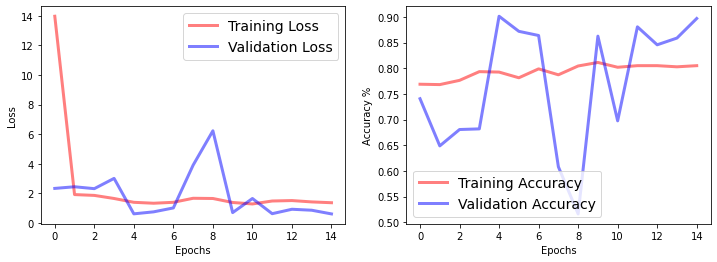

In [89]:
plot_acc(history)